<h2>Purpose of file</h2>

To geocode exisitng clinic locations, and check how accessible these are using the ORS isochrone API. Then, iterate over each of the candidate locations, and add each candidate new location to the array of current clinics and determine what % increase this has on accessibility within X miles/minutes for the whole Local Authority in scope. 

<h1>Note on environment used before</h1>

Use the equity_carbon_tool environment to run this file.

<h2>Import libraries</h2>

In [2]:
import simpy
import random
from statistics import mean #allows us to take a mean of a list easily
import matplotlib.pyplot as plt
import pandas as pd
import csv
import requests
import json
import geopandas as gpd
import numpy as np
import time
import os
import itertools
import folium
import contextily as cx
from shapely import wkt

#import module for auto report
import docx

#import geospatial analysis methods
from shapely.ops import unary_union
from shapely.geometry import Polygon
from shapely.geometry import Point

#import bng-latlon library to convert x y to lat long
from bng_latlon import OSGB36toWGS84

<h2>Define functions</h2>

In [3]:
#Geocode function to create 
def geocode_postcodes(apiKey, dict_location_to_postcodes):
    clinic_names = []
    clinic_postcodes = []
    clinic_coords = []
    list_keys_that_error = []
    
    counter = 1
    
    for key in dict_location_to_postcodes.keys():
        try: 
            #update lists above
            clinic_names.append(key)
            clinic_postcodes.append(dict_location_to_postcodes[key])

            #set up API call
            headers = {
            'Accept': 'application/json, application/geo+json, application/gpx+xml, img/png; charset=utf-8',
            }
            call = requests.get(f'https://api.openrouteservice.org/geocode/search?api_key={apiKey}&text={dict_location_to_postcodes[key]}', headers=headers)

            json_object = json.loads(call.text)
            #print(call.status_code, call.reason)
            #print(call.text)
            long, lat = json_object['features'][0]['geometry']['coordinates']
            clinic_coords.append([long, lat])
            print(f'Clinic {counter} of {len(dict_location_to_postcodes.keys())} geocoding complete. Forcing 2 second delay for geocode API to run')
            counter += 1
            time.sleep(2)
        except IndexError:
           list_keys_that_error.append(key) 
           print(f'ERROR with clinic {counter} of {len(dict_location_to_postcodes.keys())}. Key logged. Forcing 2 second delay for geocode API to run')
           counter += 1
           time.sleep(2)

    #work in progress cell
    #take the list of coords for the geocoded clinics and create a GeoDataFrame
    list_clinic_coords = []
    for index in range(len(clinic_coords)):
        temp_list = []
        temp_list.append(clinic_names[index])
        temp_list.append(clinic_coords[index][0])
        temp_list.append(clinic_coords[index][1])
        list_clinic_coords.append(temp_list)
    df_clinic_coords = pd.DataFrame(list_clinic_coords, columns=['clinic_name', 'lat', 'long'])

    clinic_geometry = gpd.points_from_xy(df_clinic_coords.long, df_clinic_coords.lat)
    geodf_clinic_points_ = gpd.GeoDataFrame(df_clinic_coords[['clinic_name', 'long', 'lat']], geometry = clinic_geometry, crs='EPSG:4326') #was 27700
    #geodf_clinic_points_

    #testing flipping back to lat lon (instead of long lat above, which is the order folium requires)
    clinic_geometry = gpd.points_from_xy(df_clinic_coords.lat, df_clinic_coords.long)
    test_geodf_clinic_points_reversed = gpd.GeoDataFrame(df_clinic_coords[['clinic_name', 'long', 'lat']], geometry = clinic_geometry, crs='EPSG:4326') #was 27700
    test_geodf_clinic_points_reversed

    return(test_geodf_clinic_points_reversed, clinic_names, clinic_postcodes, clinic_coords, list_keys_that_error)


In [4]:
#function to subset  a dataframe
def subset_df_to_la(la_name_string, col_name, df_to_subset):
    mask = df_to_subset[col_name] == la_name_string
    la_subset_df = df_to_subset[mask]
    return(la_subset_df)

In [5]:
def plot_heatmap(
    geometry_geodf, 
    data_geodf, 
    list_columns_to_use, 
    key_value_str, 
    clinic_coords, 
    colorbrewer_color_str, 
    fill_opacity,
    line_opacity,
    legend_name_str
    ):

    """
    Function to plot a heat map (chloropleth). ColorBrewer colour information available from https://colorbrewer2.org/#type=sequential&scheme=BuGn&n=3
    """

    new_map = folium.Map(location=([clinic_coords[0][1], clinic_coords[0][0]]), zoom_start=11)

    folium.Choropleth(
        geo_data=geometry_geodf, #geodf
        data=data_geodf, #geodf
        columns=list_columns_to_use,
        key_on=f"feature.properties.{key_value_str}", #if geodf use feature.properties.[col name]
        #fill_color="RdYlGn", #YlGnBu
        fill_color=colorbrewer_color_str, #YlGnBu
        fill_opacity=fill_opacity, #float <=1
        line_opacity=line_opacity, #float <=1
        legend_name=legend_name_str
    ).add_to(new_map)

    return(new_map)

In [6]:
def go_up_one_directory():
    """
    Function to take the current working directory up one level
    """
    #starting directory
    print(os.getcwd())
    #code to go up one directory
    path_parent = os.path.dirname(os.getcwd())
    os.chdir(path_parent)
    #print revised directory to check this function has done its task as expected
    print(os.getcwd())

In [7]:
def create_subdirectory(new_folder_name):
    """
    Function to check whether a provider folder name exists in the current working directory. 
    If it does not exist, this folder is created.
    """
    #logic to check if new_folder_name folder exists, if not, create it
    if os.path.exists(new_folder_name) == False:
        os.makedirs(new_folder_name)

In [8]:
def convert_df_to_dict(
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites,
        means_of_travel
        ):
    #convert the file we have just read in (or the output of the iso API call, whichever route was used) to a dictionary
    dict_nested_lsoa_travel_means_as_polygons_new_sites_not_nested = dict(zip(gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['index'], gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['geometry']))
    #dict_nested_lsoa_travel_means_as_polygons_new_sites

    #The code that runs after running the long API call requires a nested dict structure. To be able to use this same code, we need to have a like nested structure. 
    #the below is hard-coded for now to add in the driving-car nested key. 
    #Once working, need to adjust for all travel means
    dict_nested_lsoa_travel_means_as_polygons_new_sites = {}
    for key in dict_nested_lsoa_travel_means_as_polygons_new_sites_not_nested.keys():
        temp_dict = {}
        temp_dict[means_of_travel] = dict_nested_lsoa_travel_means_as_polygons_new_sites_not_nested[key]
        dict_nested_lsoa_travel_means_as_polygons_new_sites[key] = temp_dict
    return(dict_nested_lsoa_travel_means_as_polygons_new_sites)

In [9]:
def create_dict_merged_polygons_candidate_sites(
        dict_nested_lsoa_travel_means_as_polygons_new_sites,
        means_of_travel,
        dict_travel_means_merged_baseline_poly
        ):
    '''
    Function to loop over all isochrone polygons created previously for each lsoa and travel mode, and merge these with the respective baseline merged polygon for each travel mode
    These are then saved in a dictionary with keys of travel mode, and values of the new merged polygon
    This function is structured to be called for separately, once for each means_of_travel which must be passed to the function as an argument
    '''

    dict_travel_means_merged_poly_new_clinic_site = {}
    mode = means_of_travel

    test_subset = dict_nested_lsoa_travel_means_as_polygons_new_sites.keys()

    #for lsoa in test_subset['LSOA11CD']:
    for lsoa in test_subset:
        #print(lsoa)
        #dict containing the merged polys for each travel mode for as-is clinics
        #dict_travel_means_merged_baseline_poly

        dict_lsoa_travel_mode_new_site = {}

    #for mode in list_travel_means:
        #print(f"    {mode}")
        points = []
        #add polygon coords for merged isochrone associated with the original baseline / as-is clinics
        points.append(dict_travel_means_merged_baseline_poly[mode][0])
        #add the polygon coords for the new lsoa centroid isochrone being modelled (potential new clinc location)
        points.append(dict_nested_lsoa_travel_means_as_polygons_new_sites[lsoa][mode]) 
        
        temp_boundary = gpd.GeoSeries(unary_union(points)).set_crs('EPSG:4326')
        temp_boundary = temp_boundary.to_crs(27700) #new line 18/3 changing crs to 27700 to get area at subsequent stage
        
        dict_lsoa_travel_mode_new_site[mode] = temp_boundary
        
        dict_travel_means_merged_poly_new_clinic_site[lsoa] = dict_lsoa_travel_mode_new_site
    
    return(dict_travel_means_merged_poly_new_clinic_site, test_subset)

In [10]:
def plot_access_gain_results(
        dict_lsoa_mode_acessibility_area,
        subset_df,
        means_of_travel_wording_for_title,
        drive_time
):

    #store results in a pandas df for the driving means of travel we are on
    df_results_driving_access_percent_gain = pd.DataFrame.from_dict(dict_lsoa_mode_acessibility_area, orient='index').rename(columns={0:'net_access_percent_gain'})
    #reset index
    df_results_driving_access_percent_gain_reset_index = df_results_driving_access_percent_gain.reset_index()
    #convert to geodf
    geodf_results_driving_access_percent_gain_reset_index = gpd.GeoDataFrame(df_results_driving_access_percent_gain_reset_index).rename(columns={'index': 'LSOA11CD'})

    #merge the result net gain in access % with the geodf so we can subsequently plot the results as a heat map
    df_subset_df = pd.DataFrame(subset_df)
    df_subset_df_joined = pd.merge(df_subset_df, geodf_results_driving_access_percent_gain_reset_index, how='left', on='LSOA11CD')
    geodf_subset_df_joined = gpd.GeoDataFrame(df_subset_df_joined)


    #Next, create the heat map, adding points to the map in the correct location for the current clinics as well as the candidate location.
    #The maps of improved access for each possible new site are saved as assets and later brought into the automated report.

    #create the outer border for the LA of interest
    geodf_la_border = geodf_subset_df_joined.dissolve('UTLA21NM')

    fig, ax = plt.subplots(1, figsize=(10, 6))
    column = 'net_access_percent_gain'

    #set colour map to be shades of red
    cmap = 'Purples'

    #plot lsoa geometries shaded by net journey reduction
    geodf_subset_df_joined.plot(column=column, ax=ax, cmap=cmap, alpha=0.5) 

    geodf_la_border.plot(color='None', edgecolor='black', linewidth=1, ax=ax) #plot outer LA border

    ax.axis('off')

    #set min and max for colour bar
    vmin = geodf_subset_df_joined[column].min() #get min value for the colour bar from the associated field being shaded
    vmax = geodf_subset_df_joined[column].max() #get max value for the colour bar from the associated field being shaded

    # Create colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    cbar = fig.colorbar(sm, alpha=0.5)

    #add title
    ax.set_title(f'LSOA heatmap of areas yielding the greatest\n percentage point gain in access \n by {means_of_travel_wording_for_title} in {drive_time/60} mins (% of the whole LA)')

    #add legend, use bbox_to_anchor to specify the location of the legend - requires some experimentation to align correctly.
    ax.legend(loc='best', bbox_to_anchor=(0.5,0))

    #set tight layout to minimise white space
    plt.tight_layout()

    #add basemap with contextily
    cx.add_basemap(ax, crs=geodf_subset_df_joined.crs, source=cx.providers.Stamen.TonerLite)
    print(os.getcwd())
    plt.savefig(f'{means_of_travel_wording_for_title}_{drive_time/60}_mins_heat_map_reduced_journey_distance.png', bbox_inches='tight')
    #plt.show()

    return(geodf_subset_df_joined, fig)

In [11]:
def create_x_y_scatter_chart(
        geodf_subset_df_joined,
        df_pop_estimate_persons_la_interest_subset,
        means_of_travel_for_title,
        journey_time
):
    #mask the net percentage point improvement, to remove the lsoas that already have a clinic in them.
    mask = geodf_subset_df_joined['net_access_percent_gain'].notnull()
    df_percent_gain_la_interest = geodf_subset_df_joined[mask]

    #subset the masked df to just the LSOA11CD and net_access_percent_gain cols
    df_percent_gain_la_interest_subset = df_percent_gain_la_interest[['LSOA11CD', 'net_access_percent_gain']]

    #now merged the dfs, so we have a single df containing the % point improvement in access each LSOA represents, and the population estimate (all ages) for that same LSOA
    df_pop_estimate_persons_and_pct_gain_merged = pd.merge(df_percent_gain_la_interest_subset, df_pop_estimate_persons_la_interest_subset)

    #set up the x and y variables, as well as the lsoa labels
    x = df_pop_estimate_persons_and_pct_gain_merged['net_access_percent_gain']
    y = df_pop_estimate_persons_and_pct_gain_merged['All Ages']
    lsoa_labels = df_pop_estimate_persons_and_pct_gain_merged['LSOA11CD']

    #find the index of the max value on the x axis
    index_x_max = x.argmax()
    
    fig, ax = plt.subplots(1, figsize=(10, 6))

    #plot the x,y scatter chart
    plt.scatter(x,y)

    #label axes
    plt.ylabel('Pop. size (all ages, people)')
    plt.xlabel(f'Accessibility % point increase')

    #annotation of the max point
    plt.text(x[index_x_max], y[index_x_max]+25, lsoa_labels[index_x_max])

    #add title
    plt.title(f'Scatter plot of population size (all ages / persons) \nand % point increase in access by \n{means_of_travel_for_title} within {journey_time/60} mins')

    #display the plot
    plt.show()

    #return the plot
    return(fig, df_pop_estimate_persons_and_pct_gain_merged)

In [12]:

def brute_force_test_clinic_in_all_lsoas(
        test_geodf_clinic_points_reversed,
        dict_travel_mode_travel_time,
        apiKey,
        means_of_travel
):

    '''
    Function to get the isochrone polygon for every LSOA not currently containing a clinic.
    Pass a means_of_travel (e.g. 'driving-car') to the function
    This means the function needs to be called for each means of travel this is being run for
    This is so that when calling this function, because it has a long run time, we can check the outputs 
    are as expected after c.30mins, and run for 2 hours before checking the output.
    '''

    #test_subset = test_geodf_clinic_points_reversed[:100:2] #works with 50 lsoas, line used for testing
    test_subset = test_geodf_clinic_points_reversed #run for ALL lsoas in the df passed to the function (warning: can have a long run time, 33 mins for 481 LSOAs)
    test_subset = test_subset.reset_index().drop('index', axis=1)

    travel_means = means_of_travel

    #test_subset here is actually not a subset, it contains all LSOAs in which we dont currently have a clinic. Retained variable name for ease / avoid changing variable names in file. 
    #test_subset = test_geodf_clinic_points_reversed.reset_index().drop('index', axis=1)

    new_clinic_coords = []
    for i in range(len(test_subset)):
        temp_list = []
        temp_list.append(test_subset.loc[i,'Y'])
        temp_list.append(test_subset.loc[i,'X'])
        new_clinic_coords.append(temp_list)

    #nested for loop to call isochrones API for each travel means in 
    dict_nested_lsoa_travel_means_new_sites = {}
    dict_nested_lsoa_travel_means_as_polygons_new_sites = {}

    for clinic_num in range(len(test_subset)):

        converted_coords = OSGB36toWGS84(new_clinic_coords[clinic_num][1], new_clinic_coords[clinic_num][0]) 
        converted_coords_reversed = [converted_coords[1], converted_coords[0]]

        dict_travel_means_isochrones = {}
        dict_travel_means_isochrones_as_polygons = {}

        #for travel_means in list_travel_means:

        #call isochrones API - currently hardcoded to only call first item in clinic_coords list. Needs to loop through 1) each clinic and 2) each travel modality.0
        body = {"locations":[converted_coords_reversed],"range":[dict_travel_mode_travel_time[travel_means]],"intersections":"false","location_type":"destination","range_type":"time","area_units":"mi","units":"mi"}

        headers = {
            'Accept': 'application/json, application/geo+json, application/gpx+xml, img/png; charset=utf-8',
            'Authorization': apiKey,
            'Content-Type': 'application/json; charset=utf-8'
        }
        call = requests.post(f'https://api.openrouteservice.org/v2/isochrones/{travel_means}', json=body, headers=headers)
        time.sleep(3)
        json_object = json.loads(call.text)
        #print(json_object) #test print
        #list_isochrone_coords = json_object['features'][0]['geometry']['coordinates']
        list_iso_json = json_object['features'][0]['geometry']
        
        list_polygon_iso_json = Polygon(json_object['features'][0]['geometry']['coordinates'][0]) #this is converting the shape to polygon data type at point of running API

        #print(call.status_code, call.reason)
        #print(call.text)

        dict_travel_means_isochrones[travel_means] = list_iso_json
        dict_travel_means_isochrones_as_polygons[travel_means] = list_polygon_iso_json

        #dict_nested_lsoa_travel_means_new_sites[list_of_lsoas[clinic_num]] = dict_travel_means_isochrones
        #dict_nested_lsoa_travel_means_as_polygons_new_sites[list_of_lsoas[clinic_num]] = dict_travel_means_isochrones_as_polygons
        dict_nested_lsoa_travel_means_new_sites[test_subset.loc[clinic_num,'LSOA11CD']] = dict_travel_means_isochrones
        dict_nested_lsoa_travel_means_as_polygons_new_sites[test_subset.loc[clinic_num, 'LSOA11CD']] = dict_travel_means_isochrones_as_polygons
    
    return(dict_nested_lsoa_travel_means_new_sites, dict_nested_lsoa_travel_means_as_polygons_new_sites)

In [13]:
def determine_accessibility_percent_la_area(
        means_of_travel,
        test_subset,
        dict_travel_means_merged_poly_new_clinic_site,
        subset_df_outer_la_border,
        dict_baseline_accessible_area_by_travel_means,
        using_saved_data
):
    
    '''
    Function to loop through each merged isochrone (consisting of baseline merged isochrone for current clinics, 
    PLUS the isochrone for new clinic site, for all travel means, and repeat for every possible clinic site, 
    where a possilbe clinic site is defined as an lsoa population weighted centroid in which we currently dont have a clinic)
    
    This function code has an if statement in, as this is run differently depending whether the code is being run using the output
    from the API call on this occasion, or, from reading back into the file the saved csvs having previously run the API call before 
    the current use of this file.
    '''
    
    mode = means_of_travel

    dict_lsoa_mode_acessibility_area = {}
    test_dict_lsoa_cycling = {} #delete this line in final once resolved testing odd cycling results

    if using_saved_data == False:
        for lsoa in test_subset: #['LSOA11CD']: #using API call on this run
            dict_mode_acessibility_area = {}
            list_cycling_results = []
            
            merged_poly_fixed_crs = dict_travel_means_merged_poly_new_clinic_site[lsoa][mode].to_crs(27700)
            geodf_merged_poly_fixed_crs = gpd.GeoDataFrame(merged_poly_fixed_crs, columns=['geometry'], crs=27700)
            area_overlapping_ = gpd.overlay(subset_df_outer_la_border, geodf_merged_poly_fixed_crs, how='intersection')
            
            #calculate the percent covered by the current merged isochrone
            percent_accessible = round((area_overlapping_.area[0] / subset_df_outer_la_border.area[0]) * 100,8) #adjusted to remove rounding
            
            #new percent accessible minus baseline percent accessible, for the given travel means
            net_percent_change = percent_accessible - dict_baseline_accessible_area_by_travel_means[mode]

            #dict_mode_acessibility_area[mode] = net_percent_change
            dict_lsoa_mode_acessibility_area[lsoa] = net_percent_change

            #test to return the accessibility coverage for cycling for all LSOAs in scope to check if error - all are the same?
            if mode == 'cycling-road': #delete this line in final once resolved testing odd cycling results
                list_cycling_results.append(percent_accessible) #delete this line in final once resolved testing odd cycling results
        test_dict_lsoa_cycling[lsoa] = list_cycling_results  #delete this line in final once resolved testing odd cycling results

        #dict_lsoa_mode_acessibility_area[lsoa] = dict_mode_acessibility_area

    else:
        for lsoa in test_subset: #using saved data on this run
            dict_mode_acessibility_area = {}
            list_cycling_results = []
            #for mode in list_travel_means:
            #print(f"{lsoa} - {mode}")
            merged_poly_fixed_crs = dict_travel_means_merged_poly_new_clinic_site[lsoa][mode].to_crs(27700)
            geodf_merged_poly_fixed_crs = gpd.GeoDataFrame(merged_poly_fixed_crs, columns=['geometry'], crs=27700)
            area_overlapping_ = gpd.overlay(subset_df_outer_la_border, geodf_merged_poly_fixed_crs, how='intersection')
            
            #calculate the percent covered by the current merged isochrone
            percent_accessible = round((area_overlapping_.area[0] / subset_df_outer_la_border.area[0]) * 100,8) #adjusted to remove rounding
            
            #new percent accessible minus baseline percent accessible, for the given travel means
            net_percent_change = percent_accessible - dict_baseline_accessible_area_by_travel_means[mode]

            #dict_mode_acessibility_area[mode] = net_percent_change
            dict_lsoa_mode_acessibility_area[lsoa] = net_percent_change

            #test to return the accessibility coverage for cycling for all LSOAs in scope to check if error - all are the same?
            if mode == 'cycling-road': #delete this line in final once resolved testing odd cycling results
                list_cycling_results.append(percent_accessible) #delete this line in final once resolved testing odd cycling results
        test_dict_lsoa_cycling[lsoa] = list_cycling_results  #delete this line in final once resolved testing odd cycling results

    return(dict_lsoa_mode_acessibility_area)

In [14]:
def user_input_validation(travel_means):
    #driving decision
    proceed_for_this_travel_means = False
    while proceed_for_this_travel_means == False:
        run_for_this_travel_means = input(f"Would you like to run this file for {travel_means.upper()} means of travel? (y/n)").lower()
        if run_for_this_travel_means == "y" or run_for_this_travel_means == "n":
            proceed_for_this_travel_means = True
            if proceed_for_this_travel_means == True:
                if run_for_this_travel_means == 'y':
                    print(f"Great. The model will run for the {travel_means.upper()} means of travel.")
                else:
                    print(f"Ok. The model will not run for the {travel_means.upper()} means of travel.")
            else: #proceed is False
                print(f"Sorry, that is not a valid response. Please enter 'y' if you'd like to run the model for the {travel_means.upper()} means of travel, or 'n' to skip this travel means.")
        else:
            print(f"Sorry, that is not a valid response. Please enter 'y' if you'd like to run the model for the {travel_means.upper()} means of travel, or 'n' to skip this travel means.")
    return(run_for_this_travel_means)

<h3>Report functions</h3>

In [15]:
def add_df_as_table(preferred_font_name, doc, df, style):

    '''
    Add a dataframe to a pydoc doc object as a table in a style defined by the style parameter passed to the function.
    '''
    # add a table to the end and create a reference variable
    # extra row is so we can add the header row

    new_table = doc.add_table(df.shape[0]+1, df.shape[1])

    # add the header rows.
    for j in range(df.shape[-1]):
        new_table.cell(0,j).text = df.columns[j]

    # add the rest of the data frame
    for i in range(df.shape[0]):
        for j in range(df.shape[-1]):
            new_table.cell(i+1,j).text = str(df.values[i,j])

    for row in new_table.rows:
        for cell in row.cells:
            paragraphs = cell.paragraphs
            for paragraph in paragraphs:
                for run in paragraph.runs:
                    font = run.font
                    font.name = preferred_font_name
                    font.size= Pt(8)

    new_table.style = style

    return new_table

In [16]:
def change_image_size_pydoc(
    doc,
    proportion_change,
    filepath
    ):

    '''
    A function to change the size of a .png image by a proportion provided as an argument, when passing this image into the pydoc doc object.
    '''

    paraObj = doc.add_paragraph()
    run = paraObj.add_run()
    inline_shape = run.add_picture(filepath)
    
    original_width = inline_shape.width
    original_height = inline_shape.height
    #print(f"original width : {original_width}")
    #print(f"original height : {original_height}")

    new_width = int(round(original_width * proportion_change, 0))
    new_height = int(round(original_height * proportion_change, 0))
    
    inline_shape.width = new_width
    inline_shape.height = new_height

    print(f"new width : {new_width}")
    print(f"new height : {new_height}")

    return inline_shape, inline_shape.width, inline_shape.height

<h2>Set up global parameters</h2>

In [17]:
current_directory = os.getcwd()

filename = f"{current_directory}/raw_data/user_and_data_parameters/user_and_data_params.xlsx"

apiKey = pd.read_excel(filename, 'Carbon_emissions', index_col=None, usecols = "B", header = 1, nrows=0)
apiKey = list(apiKey)[0]

la_of_interest = pd.read_excel(filename, 'HEA_parameters', index_col=None, usecols = "C", header = 3, nrows=0)
la_of_interest = list(la_of_interest)[0]

#read in journey times
#these are cast to a float and then to an int. This is because in testing, despite the parameter value in the user_params excel file being 15
#when read into this file on occasion, these would be read as 15.1 
#in this situation, instead of being read as a numpy 64 int, which can be directly case to an int, it was read in by python as a string
#this then crashed when trying to convert the 15.1 string value to an int 
#you can case a string type decimal to a float though, and then, when casting the float to an int, this rounds down back to the desired value of 15 in this example
#Note: this method consistently rounds down, so even if for some reason a string -> float value of 15.9 is read in by python (when the parameter was actually 15)
#this will be cast an int type with a value of 15
user_entered_wheelchair_journey_time = int(float(pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "A", skiprows=28, nrows=0).columns[0]))
user_entered_walking_journey_time = int(float(pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "B", skiprows=28, nrows=0).columns[0]))
user_entered_cycling_journey_time = int(float(pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "C", skiprows=28, nrows=0).columns[0]))
user_entered_driving_journey_time = int(float(pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "D", skiprows=28, nrows=0).columns[0]))

#report parameters
#set parameters for document
preferred_font_name = 'Arial'
preferred_font_size = 12
appendix_count = 1 #used for incremental numbering of appendices
figure_count = 1 #used for incremental numbering of figures / charts
table_count = 1 #used for incremental numbering of tables

c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


<h3>Set up report parameters (styling etc.)</h3>

In [18]:
#dictionaries holding values that are the string descriptors in MS Word of the default table styles.
#these can be used as input to the add_df_as_table function
dict_plain_table_styles = {
    'plain_01' : 'Table Grid',
    'plain_02' : 'Table Grid Light',
    'plain_03' : 'Plain Table 1',
    'plain_04' : 'Plain Table 2',
    'plain_05' : 'Plain Table 3',
    'plain_06' : 'Plain Table 4',
    'plain_07' : 'Plain Table 5'
}

dict_grid_table_styles = {
    'grey_01': 'Grid Table 1 Light',
    'blue_01': 'Grid Table 1 Light Accent 1',
    'orange_01': 'Grid Table 1 Light Accent 2',
    'light_grey_01': 'Grid Table 1 Light Accent 3',
    'yellow_01': 'Grid Table 1 Light Accent 4',
    'teal_01': 'Grid Table 1 Light Accent 5',
    'green_01': 'Grid Table 1 Light Accent 6',
    'grey_02': 'Grid Table 2',
    'blue_02': 'Grid Table 2 Accent 1',
    'orange_02': 'Grid Table 2 Accent 2',
    'light_grey_02': 'Grid Table 2 Accent 3',
    'yellow_02': 'Grid Table 2 Accent 4',
    'teal_02': 'Grid Table 2 Accent 5',
    'green_02': 'Grid Table 2 Accent 6',
    'grey_03': 'Grid Table 3',
    'blue_03': 'Grid Table 3 Accent 1',
    'orange_03': 'Grid Table 3 Accent 2',
    'light_grey_03': 'Grid Table 3 Accent 3',
    'yellow_03': 'Grid Table 3 Accent 4',
    'teal_03': 'Grid Table 3 Accent 5',
    'green_03': 'Grid Table 3 Accent 6',
    'grey_04': 'Grid Table 4',
    'blue_04': 'Grid Table 4 Accent 1',
    'orange_04': 'Grid Table 4 Accent 2',
    'light_grey_04': 'Grid Table 4 Accent 3',
    'yellow_04': 'Grid Table 4 Accent 4',
    'teal_04': 'Grid Table 4 Accent 5',
    'green_04': 'Grid Table 4 Accent 6',
    'grey_05': 'Grid Table 5 Dark',
    'blue_05': 'Grid Table 5 Dark Accent 1',
    'orange_05': 'Grid Table 5 Dark Accent 2',
    'light_grey_05': 'Grid Table 5 Dark Accent 3',
    'yellow_05': 'Grid Table 5 Dark Accent 4',
    'teal_05': 'Grid Table 5 Dark Accent 5',
    'green_05': 'Grid Table 5 Dark Accent 6',
    'grey_06': 'Grid Table 6 Colorful',
    'blue_06': 'Grid Table 6 Colorful Accent 1',
    'orange_06': 'Grid Table 6 Colorful Accent 2',
    'light_grey_06': 'Grid Table 6 Colorful Accent 3',
    'yellow_06': 'Grid Table 6 Colorful Accent 4',
    'teal_06': 'Grid Table 6 Colorful Accent 5',
    'green_06': 'Grid Table 6 Colorful Accent 6',
    'grey_07': 'Grid Table 7 Colorful',
    'blue_07': 'Grid Table 7 Colorful Accent 1',
    'orange_07': 'Grid Table 7 Colorful Accent 2',
    'light_grey_07': 'Grid Table 7 Colorful Accent 3',
    'yellow_07': 'Grid Table 7 Colorful Accent 4',
    'teal_07': 'Grid Table 7 Colorful Accent 5',
    'green_07': 'Grid Table 7 Colorful Accent 6'

}

dict_list_table_styles = {
    'grey_01': 'List Table 1 Light',
    'blue_01': 'List Table 1 Light Accent 1',
    'orange_01': 'List Table 1 Light Accent 2',
    'light_grey_01': 'List Table 1 Light Accent 3',
    'yellow_01': 'List Table 1 Light Accent 4',
    'teal_01': 'List Table 1 Light Accent 5',
    'green_01': 'List Table 1 Light Accent 6',
    'grey_02': 'List Table 2',
    'blue_02': 'List Table 2 Accent 1',
    'orange_02': 'List Table 2 Accent 2',
    'light_grey_02': 'List Table 2 Accent 3',
    'yellow_02': 'List Table 2 Accent 4',
    'teal_02': 'List Table 2 Accent 5',
    'green_02': 'List Table 2 Accent 6',
    'grey_03': 'List Table 3',
    'blue_03': 'List Table 3 Accent 1',
    'orange_03': 'List Table 3 Accent 2',
    'light_grey_03': 'List Table 3 Accent 3',
    'yellow_03': 'List Table 3 Accent 4',
    'teal_03': 'List Table 3 Accent 5',
    'green_03': 'List Table 3 Accent 6',
    'grey_04': 'List Table 4',
    'blue_04': 'List Table 4 Accent 1',
    'orange_04': 'List Table 4 Accent 2',
    'light_grey_04': 'List Table 4 Accent 3',
    'yellow_04': 'List Table 4 Accent 4',
    'teal_04': 'List Table 4 Accent 5',
    'green_04': 'List Table 4 Accent 6',
    'grey_05': 'List Table 5 Dark',
    'blue_05': 'List Table 5 Dark Accent 1',
    'orange_05': 'List Table 5 Dark Accent 2',
    'light_grey_05': 'List Table 5 Dark Accent 3',
    'yellow_05': 'List Table 5 Dark Accent 4',
    'teal_05': 'List Table 5 Dark Accent 5',
    'green_05': 'List Table 5 Dark Accent 6',
    'grey_06': 'List Table 6 Colorful',
    'blue_06': 'List Table 6 Colorful Accent 1',
    'orange_06': 'List Table 6 Colorful Accent 2',
    'light_grey_06': 'List Table 6 Colorful Accent 3',
    'yellow_06': 'List Table 6 Colorful Accent 4',
    'teal_06': 'List Table 6 Colorful Accent 5',
    'green_06': 'List Table 6 Colorful Accent 6',
    'grey_07': 'List Table 7 Colorful',
    'blue_07': 'List Table 7 Colorful Accent 1',
    'orange_07': 'List Table 7 Colorful Accent 2',
    'light_grey_07': 'List Table 7 Colorful Accent 3',
    'yellow_07': 'List Table 7 Colorful Accent 4',
    'teal_07': 'List Table 7 Colorful Accent 5',
    'green_07': 'List Table 7 Colorful Accent 6'
}

#code to identify the string to use for the style of the tables in the final report
table_style = pd.read_excel(filename, 'Branding', index_col=None, usecols = "C", header = 0, nrows=5)

table_style_as_string = table_style.iloc[4,0]
table_style_list = table_style_as_string.split('-')

if table_style_list[0] == ".":
    chosen_style = dict_plain_table_styles[table_style_list[1]]
elif table_style_list[0] == "grid":
    chosen_style = dict_grid_table_styles[table_style_list[1]]
elif table_style_list[0] == "list":
    chosen_style = dict_list_table_styles[table_style_list[1]]
else:
    print('An error has occured with the table style import.')

#read-in user param for level_1_colour
level_1_colour = pd.read_excel(filename, 'Branding', index_col=None, usecols = "D", header = 1, nrows=0)
level_1_colour = list(level_1_colour)[0]
#read-in user param for level_2_colour
level_2_colour = pd.read_excel(filename, 'Branding', index_col=None, usecols = "D", header = 2, nrows=0)
level_2_colour = list(level_2_colour)[0]
#read-in user param for level_2_colour
level_3_colour = pd.read_excel(filename, 'Branding', index_col=None, usecols = "D", header = 3, nrows=0)
level_3_colour = list(level_3_colour)[0]
#read-in user param for level_2_colour
level_4_colour = pd.read_excel(filename, 'Branding', index_col=None, usecols = "D", header = 4, nrows=0)
level_4_colour = list(level_4_colour)[0]

#dictionaries of to convert level 1-4 colour variables containing hex colours to text colour description
dict_level_1_hex_to_colour = {
    '#003087': 'dark blue',
    '#005EB8': 'blue',
    '#0072CE': 'bright blue',
    '#41B6E6': 'light blue',
    '#00A9CE': 'aqua blue',
}

dict_level_2_hex_to_colour = {
    '#768692': 'grey',
    '#E8EDEE': 'grey',
    '#231f20': 'black',
    '#425563': 'dark grey',
    '#FFFFFF': 'white',
}

dict_level_3_hex_to_colour = {
    '#006747': 'dark green',
    '#009639': 'green',
    '#78BE20': 'light green',
    '#00A499': 'green'
}

dict_level_4_hex_to_colour = {
    '#330072': 'purple',
    '#7C2855': 'dark pink',
    '#AE2573': 'pink',
    '#8A1538': 'dark red',
    '#DA291C': 'red',
    '#ED8B00': 'orange',
    '#FFB81C': 'yellow',
    '#FAE100': 'yellow',
}

c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn

<h2>Define Classes</h2>

In [19]:
class g():
    def __init__(
        self, 
        apiKey, 
        user_entered_driving_journey_time,
        user_entered_cycling_journey_time,
        user_entered_walking_journey_time,
        user_entered_wheelchair_journey_time
        ):

        self.apiKey = apiKey
        self.df_file_number = 1
        self.drive_time = user_entered_driving_journey_time * 60 #multiplied by 60 because the ORS API requires an input in seconds, so 20 * 60 required for 20 mins in units of seconds.
        self.cycle_time = user_entered_cycling_journey_time * 60 #as above 
        self.walking_time = user_entered_walking_journey_time * 60 #as above
        self.wheelchair_time = user_entered_wheelchair_journey_time * 60 #as above

#instantiate the class as global_params object
global_params = g(
    apiKey, 
    user_entered_driving_journey_time,
    user_entered_cycling_journey_time,
    user_entered_walking_journey_time,
    user_entered_wheelchair_journey_time
    )

<h2>Read in required files and subset to the local authority of interest</h2>

In [20]:
#for now, this is hardcoded to Derby, needs resolving to be flexible based on the user-provided LA
geodf_utla_shapefiles = gpd.read_file('raw_data\\open_geography_boundary_files\\UTLA_shapefiles\\Counties_and_Unitary_Authorities_(December_2021)_EN_BFC.shp')
mask = geodf_utla_shapefiles['CTYNME'] == la_of_interest
subset_df_outer_la_border = geodf_utla_shapefiles[mask]
subset_df_outer_la_border = subset_df_outer_la_border['geometry'].reset_index().drop(columns='index', axis=1)
#subset_df_outer_la_border

In [21]:
df_shapefile_lsoas = gpd.read_file('raw_data\open_geography_boundary_files\LSOA_shapefiles\Lower_Layer_Super_Output_Areas_(December_2011)_Boundaries_Generalised_Clipped_(BGC)_EW_V3.shp')
df_lsoa_to_utla = pd.read_csv('raw_data\open_geography_portal_lookups\Lower_Layer_Super_Output_Area_(2011)_to_Upper_Tier_Local_Authorities_(2021)_Lookup_in_England_and_Wales_.csv')
df_lsoa_to_imd = pd.read_csv('raw_data\ministry_of_housing_communities_local_gov\Indices_of_Multiple_Deprivation_(IMD)_2019.csv')

df_lsoa_and_utla_merged = pd.merge(df_shapefile_lsoas, df_lsoa_to_utla, how='left', on=['LSOA11CD', 'LSOA11CD'])
#df_lsoa_and_utla_and_imd_decile_merged = pd.merge(df_lsoa_and_utla_merged, df_lsoa_to_imd[['lsoa11cd, IMD_Decile']], how='left', left_on='LSOA11CD', right_on='lsoa11cd')
df_lsoa_and_utla_and_imd_decile_merged = pd.merge(df_lsoa_and_utla_merged, df_lsoa_to_imd)
subset_df = df_lsoa_and_utla_and_imd_decile_merged[['LSOA11CD', 'LONG', 'LAT', 'geometry','UTLA21CD', 'UTLA21NM', 'IMD_Decile']]

mask = subset_df['UTLA21NM'] == la_of_interest
subset_df = subset_df[mask]

#subset_df['IMD_Quintile'] = subset_df.apply(lambda row: categorise(row), axis=1)

In [22]:
#create a df consisting of all persons all ages, for all LSOAs in the LA of interest. 
#This will be used for the x, y scatter charts produced later in the file, to aid interpretation of the brute force findings of which 
#lsoas present the greatest percentage points improvement in access within X mins by different means of travel. 
#The x,y scatter will be used to put in context the % point improvement in terms population size that stands to benefit (assuming all ages / genders)

df_pop_estimate_persons = pd.read_csv('raw_data\ons_population_data\\2020_persons_pop_lsoa_syoa.csv').rename(columns={'LSOA Code' : 'LSOA11CD'})
df_pop_estimate_persons_la_interest = pd.merge(subset_df['LSOA11CD'], df_pop_estimate_persons)

df_pop_estimate_persons_la_interest_subset = df_pop_estimate_persons_la_interest[['LSOA11CD', 'All Ages']]


<h2>Set up folder structure for saving outputs</h2>

In [23]:
#check whether assets folder exists for saving the output from this file, and if not, create this folder
brute_force_assets_path = 'Assets_produced_by_code\\06_brute_force_optimisation_assets'

create_subdirectory(brute_force_assets_path)

<h2>Read-in the current locations</h2>

In [24]:
#read in parameters for new clinic location(s)
df_existing_clinics = pd.read_excel(filename, 'Clinic_details', index_col=None, usecols = "A:C", header = 1)

#subset this df of clinic details to just the LA of interest
mask = df_existing_clinics['LocalAuthority'] == la_of_interest
df_existing_clinics = df_existing_clinics[mask]

existing_clinic_location_names = list(df_existing_clinics.loc[:, 'clinic_name'])
existing_clinic_location_postcodes = list(df_existing_clinics.loc[:, 'postcode'])

#create dictionary of clinic name (key) to postcode (value) - for later use when creating isochrones for EXISTING clinics
dict_existing_clinic_to_postcode = {}
for idx in range(len(existing_clinic_location_names)):
    dict_existing_clinic_to_postcode[existing_clinic_location_names[idx]] = existing_clinic_location_postcodes[idx]

c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


<h2>Geocode each new location</h2>

call function created above to geocode clinics - in this case, Derbyshire clinics, using dict hardcoded above (dev required: read user params file info on clinic locations into a dict structured the same as above, and the call to the function below will still work)

In [25]:

test_geodf_clinic_points_reversed, clinic_names, clinic_postcodes, clinic_coords, list_keys_that_error = geocode_postcodes(global_params.apiKey, dict_existing_clinic_to_postcode)

Clinic 1 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 2 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 3 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 4 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 5 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 6 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 7 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 8 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 9 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 10 of 10 geocoding complete. Forcing 2 second delay for geocode API to run


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


<h2>Create the isochrones for each geocoded postcode location</h2>

In [26]:
#Api profiles for different means for travel
dict_travel_means = {
    'car': 'driving-car',
    'cycle_road' : 'cycling-road',
    'walk' : 'foot-walking',
    'wheelchair' : 'wheelchair'
}

list_travel_means = ['driving-car', 'cycling-road', 'foot-walking', 'wheelchair']

In [27]:
#create variables containing the travel time for each mode of travel in scope. This will determine what the isochrone shows. 
#This is user entered parameter multiplied by 60 because the ORS API requires an input in seconds

drive_time = global_params.drive_time
cycle_time = global_params.cycle_time
walking_time = global_params.walking_time
wheelchair_time = global_params.wheelchair_time

In [28]:
#create dict of travel mode to travel time
dict_travel_mode_travel_time = {
    'driving-car' : drive_time,
    'cycling-road' : cycle_time,
    'foot-walking' : walking_time,
    'wheelchair' : wheelchair_time
}

The next cell calls the OpenRouteService Isochrone API in a nested for loop. The result is a populated nested dictionary. Outer dictionary is the clinic location name, inner dictionary is the means of travel, values of inner dictionary are the lists of coords which make up the isochrone. This also populates a second nested dictionary, consisting of clinic name (outer key), travel mode (inner key), and isochrone as a polygon data type (value)

In [29]:

#nested for loop to call isochrones API for each travel means for each clinic location in scope
dict_nested_clinic_travel_means = {}
dict_nested_clinic_travel_means_as_polygons = {}

for clinic_num in range(len(clinic_names)):
    dict_travel_means_isochrones = {}
    dict_travel_means_isochrones_as_polygons = {}

    for travel_means in list_travel_means:

        #call isochrones API - currently hardcoded to only call first item in clinic_coords list. Needs to loop through 1) each clinic and 2) each travel modality.0
        body = {"locations":[clinic_coords[clinic_num]],"range":[dict_travel_mode_travel_time[travel_means]],"intersections":"false","location_type":"destination","range_type":"time","area_units":"mi","units":"mi"}

        headers = {
            'Accept': 'application/json, application/geo+json, application/gpx+xml, img/png; charset=utf-8',
            'Authorization': f'{global_params.apiKey}',
            'Content-Type': 'application/json; charset=utf-8'
        }
        call = requests.post(f'https://api.openrouteservice.org/v2/isochrones/{travel_means}', json=body, headers=headers)

        json_object = json.loads(call.text)
        #list_isochrone_coords = json_object['features'][0]['geometry']['coordinates']
        list_iso_json = json_object['features'][0]['geometry']
        
        list_polygon_iso_json = Polygon(json_object['features'][0]['geometry']['coordinates'][0]) #this is converting the shape to polygon data type at point of running API

        #print(call.status_code, call.reason)
        #print(call.text)

        dict_travel_means_isochrones[travel_means] = list_iso_json
        dict_travel_means_isochrones_as_polygons[travel_means] = list_polygon_iso_json

        #check how many calls to the API there will be in the current use case, derived by number of clinics x number of travel means.
        #if this is greater than 20 (the rate limit of API calls per min from ORS isochrone service), then sleep (pause) the runing 
        #of the code block after each API call for 3.5 seconds. This ensures there are not more than 20 calls per minute, and avoids 
        #the code failing to run. 
        #The trade-off is that for large numbers of clinics this section can take a long-ish time to run (e.g. c. 2.5 mins for 12 clinics * 4 travel means)
        if len(list_travel_means) * len(clinic_names) > 20:
            time.sleep(3.5)
    dict_nested_clinic_travel_means[clinic_names[clinic_num]] = dict_travel_means_isochrones
    dict_nested_clinic_travel_means_as_polygons[clinic_names[clinic_num]] = dict_travel_means_isochrones_as_polygons


<h2>Assign file paths for saving the output merged isochrones (saving not yet coded - future development)</h2>

In [30]:
#create variables to contain the filenames we will later give to the isochrone shape files
isochrones_car_filename = 'isochrones\iso_union_car.shp'
isochrones_bike_filename = 'isochrones\iso_union_bike.shp' 
isochrones_wheelchair_filename = 'isochrones\iso_union_wheelchair.shp' 
isochrones_walk_filename = 'isochrones\iso_union_walk.shp' 

#final file with all generated information 
output_file = 'isochrones\all_final.geojson'

<h2>Use folium to render map</h2>

tutorial for folium icons and markers: https://towardsdatascience.com/folium-mapping-displaying-markers-on-a-map-6bd56f3e3420#:~:text=Adding%20a%20Single%20Marker%20to,and%20longitude%20of%20our%20data.

In [31]:
#change current directory to the assets folder for this file
print(os.getcwd())
os.chdir(brute_force_assets_path)
print(os.getcwd())

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\06_brute_force_optimisation_assets


In [32]:
#loop through all travel means, create isochrone map, assign to dict with key of travel means, value of map. 
# save each mapped travel means to file with a file name including the journey time parameter as defined for each travel means

#set the style for the LA border plotted on the map
#parameters for this are available at https://leafletjs.com/reference.html#path-option 
# scroll down to "Path" section on that page for a table of all style parameters
style = {"stroke": True, "fill": False, "color": "red", "weight": 2}

la_polygon = gpd.GeoDataFrame(subset_df_outer_la_border['geometry'])
dict_travel_means_access_maps = {}
for travel_means in list_travel_means:
    map = folium.Map(location=([clinic_coords[0][1], clinic_coords[0][0]]), zoom_start=12)
    #add la border to the mamp
    folium.GeoJson(data=la_polygon, style_function = lambda x: style).add_to(map)

    for clinic in range(len(clinic_coords)):
        #add a clinic icon to indicate the clinic location on the map
        folium.Marker(location=[clinic_coords[clinic][1], clinic_coords[clinic][0]], icon=folium.Icon(color='blue', icon='home')).add_to(map)

    #test_ =  json_object['features'][0]['geometry']
        #add each isochrone around each clinic location to the map, for the current travel_means
        folium.GeoJson(data=dict_nested_clinic_travel_means[clinic_names[clinic]][travel_means]).add_to(map)
        #assign this map to the dictionary with the travel_means as key and the map object as the value
        dict_travel_means_access_maps[travel_means] = map
        #save the map to file
        map.save(f'map_clinic_access_{int(round(dict_travel_mode_travel_time[travel_means]/60,0))}_min_{travel_means}.html')

In [33]:
la_polygon = gpd.GeoDataFrame(subset_df_outer_la_border['geometry'])

#set the style for the LA border plotted on the map
#parameters for this are available at https://leafletjs.com/reference.html#path-option 
# scroll down to "Path" section on that page for a table of all style parameters
style = {"stroke": True, "fill": False, "color": "red", "weight": 2}

#adjust the integer value of zoom_start to change how zoomed in or out the map is when rendered
map = folium.Map(location=([clinic_coords[0][1], clinic_coords[0][0]]), zoom_start=9)

for clinic in range(len(clinic_coords)):
    folium.Marker(location=[clinic_coords[clinic][1], clinic_coords[clinic][0]], icon=folium.Icon(color='blue', icon='home')).add_to(map)

#test_ =  json_object['features'][0]['geometry']
    folium.GeoJson(data=dict_nested_clinic_travel_means[clinic_names[clinic]]['driving-car']).add_to(map)
    folium.GeoJson(data=la_polygon, style_function = lambda x: style).add_to(map)
#call map to display the map
map

In [34]:
#save map to html file
#map.save('map_IMD_all_access_points_driving_20_mins.html')

<h2>Merge isochones for all unique means of travel, to each clinic</h2>

Now we want to merge isochones for all unique means of travel, to each clinic. This should result in a single isochrone to map, representing the area on the map within which it is possible to access at least one of the clinics via the travel mode being modelled, within the user-defined number of minutes (currently, 15 minutes driving).

In [35]:
#take the polygons for each clinic location for each given means of travel and put these into a list
dict_list_poly_travel_mode = {}
for mode in list_travel_means:
    temp_list = []
    for clinic in clinic_names:
        temp_list.append(dict_nested_clinic_travel_means_as_polygons[clinic][mode])
    dict_list_poly_travel_mode[mode] = temp_list


#now merge the baseline polygons and assign to a dict, with key of travel mode and value of the merged polygons
#we can use this to later calculate the accessibility % for the baseline arrangement of clinics. 
#and then, build on this for potential new clinic locations to see their impact on the accessiblity %.
dict_travel_means_merged_baseline_poly = {}
for mode in list_travel_means:
    temp_boundary = gpd.GeoSeries(unary_union(dict_list_poly_travel_mode[mode])).set_crs('EPSG:4326')
    dict_travel_means_merged_baseline_poly[mode] = temp_boundary



create the dictionary of baseline area of the LA that is accessible within X minutes by each means of travel, where X is the user-entered parameter for the journey time for each respective means of travel.

In [36]:
dict_baseline_accessible_area_by_travel_means = {}
for mode in list_travel_means:
    temp_df = gpd.GeoDataFrame(dict_travel_means_merged_baseline_poly[mode], columns=['geometry'], geometry='geometry', crs=4326)
    temp_df.to_crs(27700, inplace=True)
    baseline_area_overlapping = gpd.overlay(subset_df_outer_la_border, temp_df, how='intersection')
    baseline_percent = round((baseline_area_overlapping['geometry'][0].area / subset_df_outer_la_border['geometry'][0].area) * 100, 3)
    dict_baseline_accessible_area_by_travel_means[mode] = baseline_percent
dict_baseline_accessible_area_by_travel_means

{'driving-car': 54.696,
 'cycling-road': 14.972,
 'foot-walking': 1.184,
 'wheelchair': 0.755}

In [37]:
#test print cell - used to work through problem - delete in final
#dict_travel_means_merged_baseline_poly['cycling-road'].set_crs('EPSG:4326').plot()


<h2>Now map the merged isochones</h2>

visualise the folium maps for baseline isochrones (validating preceding code works)

In [38]:
map = folium.Map(location=([clinic_coords[0][1], clinic_coords[0][0]]), zoom_start=9, crs='EPSG3857')

#style_function = {'fillColor': '#0000ff'}

#style = {'features': '#f50a0a'}
#style = {'features': '#DE3163'}
#style = {'features': '#007AA5'}
style = {'features': '#00CC99'}
la_border_style = {"stroke": True, "fill": False, "color": "red", "weight": 2}

for clinic in range(len(clinic_coords)):
    folium.Marker(location=[clinic_coords[clinic][1], clinic_coords[clinic][0]], icon=folium.Icon(color='blue', icon='home')).add_to(map)

#test_ =  json_object['features'][0]['geometry']
    #folium.GeoJson(data=dict_nested_clinic_travel_means[clinic_names[clinic]]['driving-car']).add_to(map)

    '''
    next line works when the hardcoded approach above to derive 'boundary' is in use
    '''
    #folium.GeoJson(data=boundary, style_function = lambda x: style).add_to(map) 
    '''
    Next line is currently hardcoded to map driving, but refers to the dict - this is just to prove the merge is working. 
    TBC whether to iterate over all travel modes and produce / save map for each. 
    '''
#folium.GeoJson(data=dict_travel_means_merged_baseline_poly['driving-car'], style_function = lambda x: style).add_to(map)
#folium.GeoJson(data=dict_travel_means_merged_baseline_poly['cycling-road'], style_function = lambda x: style).add_to(map)
folium.GeoJson(data=dict_travel_means_merged_baseline_poly['foot-walking'], style_function = lambda x: style).add_to(map)
#folium.GeoJson(data=dict_travel_means_merged_baseline_poly['wheelchair'], style_function = lambda x: style).add_to(map)

#add la border to map
folium.GeoJson(data=la_polygon, style_function = lambda x: la_border_style).add_to(map)

#call map to display the map
map

In [39]:
map = folium.Map(location=([clinic_coords[0][1], clinic_coords[0][0]]), zoom_start=9, crs='EPSG3857')

style = {'features': '#00CC99'}
la_border_style = {"stroke": True, "fill": False, "color": "red", "weight": 2}

for clinic in range(len(clinic_coords)):
    folium.Marker(location=[clinic_coords[clinic][1], clinic_coords[clinic][0]], icon=folium.Icon(color='blue', icon='home')).add_to(map)

folium.GeoJson(data=dict_travel_means_merged_baseline_poly['driving-car'], style_function = lambda x: style).add_to(map)
#folium.GeoJson(data=dict_travel_means_merged_baseline_poly['cycling-road'], style_function = lambda x: style).add_to(map)
#folium.GeoJson(data=dict_travel_means_merged_baseline_poly['foot-walking'], style_function = lambda x: style).add_to(map)
#folium.GeoJson(data=dict_travel_means_merged_baseline_poly['wheelchair'], style_function = lambda x: style).add_to(map)

#add la border to map
folium.GeoJson(data=la_polygon, style_function = lambda x: la_border_style).add_to(map)

#call map to display the map
map

In [40]:
#loop through all travel means, create MERGED isochrone map, assign to dict with key of travel means, value of map. 
# save each mapped travel means to file with a file name including the journey time parameter as defined for each travel means

style = {'features': '#00CC99'}
la_border_style = {"stroke": True, "fill": False, "color": "red", "weight": 2}

dict_travel_means_access_maps_merged_isos = {}
for travel_means in list_travel_means:
    map = folium.Map(location=([clinic_coords[0][1], clinic_coords[0][0]]), zoom_start=9)

    for clinic in range(len(clinic_coords)):
        folium.Marker(location=[clinic_coords[clinic][1], clinic_coords[clinic][0]], icon=folium.Icon(color='blue', icon='home')).add_to(map)

    #test_ =  json_object['features'][0]['geometry']
    folium.GeoJson(data=dict_travel_means_merged_baseline_poly[travel_means], style_function = lambda x: style).add_to(map)
    folium.GeoJson(data=la_polygon, style_function = lambda x: la_border_style).add_to(map)

    dict_travel_means_access_maps_merged_isos[travel_means] = map
    map.save(f'map_clinic_access_{int(round(dict_travel_mode_travel_time[travel_means]/60,0))}_min_{travel_means}_merged_iso.html')

<h2>Read in the LSOA files, and filter to the relevant Local Authority of interest</h2>

In [41]:
#go back up two directories so we can then read in the required reference files in the next cell
go_up_one_directory()
go_up_one_directory()

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\06_brute_force_optimisation_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


In [42]:
shapefile_lsoas = gpd.read_file('raw_data\open_geography_boundary_files\LSOA_shapefiles\Lower_Layer_Super_Output_Areas_(December_2011)_Boundaries_Generalised_Clipped_(BGC)_EW_V3.shp')

df_lsoa_to_utla = pd.read_csv('raw_data\open_geography_portal_lookups\Lower_Layer_Super_Output_Area_(2011)_to_Upper_Tier_Local_Authorities_(2021)_Lookup_in_England_and_Wales_.csv')

shapefile_lsoas.head()


,OBJECTID,LSOA11CD,LSOA11NM,LSOA11NMW,BNG_E,BNG_N,LONG,LAT,Shape__Are,Shape__Len,geometry
0,1,E01000001,City of London 001A,City of London 001A,532129,181625,-0.097060,51.51810,133324.978691,2291.187925,"POLYGON ((532105.092 182011.231, 532162.491 18..."
1,2,E01000002,City of London 001B,City of London 001B,532480,181699,-0.091970,51.51868,226210.015953,2488.086900,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,3,E01000003,City of London 001C,City of London 001C,532245,182036,-0.095230,51.52176,57285.328705,1142.242230,"POLYGON ((532135.138 182198.131, 532158.250 18..."
3,4,E01000005,City of London 001E,City of London 001E,533581,181265,-0.076280,51.51452,190747.438499,2167.872156,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,5,E01000006,Barking and Dagenham 016A,Barking and Dagenham 016A,544994,184276,0.089318,51.53876,144195.364548,1935.412725,"POLYGON ((545122.049 184314.931, 545271.849 18..."


In [43]:
merged = pd.merge(shapefile_lsoas, df_lsoa_to_utla, how='left', on=['LSOA11CD', 'LSOA11CD'])
mask = merged['UTLA21NM'] == la_of_interest
temp_subset_df = merged[mask]
la_of_interest_polygon_lsoa_boundaries = gpd.GeoDataFrame(temp_subset_df[['UTLA21NM', 'LSOA11CD', 'geometry']], crs='EPSG:27700') #was 27700
la_of_interest_polygon_lsoa_boundaries.reset_index(drop=True, inplace=True)
#la_of_interest_polygon_lsoa_boundaries

In [44]:
#convert the polygon made up of all lsoa polygons in the LA of interest to crs 4326

la_of_interest_polygon_lsoa_boundaries = la_of_interest_polygon_lsoa_boundaries.to_crs(epsg=4326) 

Now, run a Point in Polygon (PIP) query to determine which LSOA(s) (polygons) contain the clinic(s) (points). This is so we can remove these lsoa's when, at a later step, we look to identify the net effect introducing a clinic in any single lsoa would have on the % of area that can access at least one clinic within the defined timescale by each means of travel

In [45]:
#use this cell to loop over each lsoa, for each clinic, and ID which lsoa codes contain clinics currently. Store their lsoa code and polygon in respective lists
#This method was informed by the tutorial at around 55 minute mark. <a>https://www.youtube.com/watch?v=kJXUUO5M4ok
#test_geodf_clinic_points_reversed['geometry'][0]

list_lsoa_codes_containing_clinics = []
list_polygons_containing_clinics = []

list_results = []
for clinic_idx in range(len(test_geodf_clinic_points_reversed)):
    for idx in range(len(la_of_interest_polygon_lsoa_boundaries['geometry'])):
        lsoa_code = la_of_interest_polygon_lsoa_boundaries.iloc[idx]['LSOA11CD']
        lsoa_poly = la_of_interest_polygon_lsoa_boundaries.iloc[idx]['geometry']
        if la_of_interest_polygon_lsoa_boundaries['geometry'].iloc[idx].contains(test_geodf_clinic_points_reversed['geometry'][clinic_idx]) == True:
            list_lsoa_codes_containing_clinics.append(lsoa_code)
            list_polygons_containing_clinics.append(lsoa_poly)

print(list_lsoa_codes_containing_clinics)
print(list_polygons_containing_clinics)

['E01019401', 'E01019598', 'E01019723', 'E01019739', 'E01019638', 'E01019679', 'E01019507', 'E01019877', 'E01019556', 'E01019609']
[<shapely.geometry.polygon.Polygon object at 0x000001B9C7E5EF10>, <shapely.geometry.polygon.Polygon object at 0x000001B9C7935D30>, <shapely.geometry.polygon.Polygon object at 0x000001B9C793F4F0>, <shapely.geometry.polygon.Polygon object at 0x000001B9C793F7F0>, <shapely.geometry.polygon.Polygon object at 0x000001B9C793A4C0>, <shapely.geometry.polygon.Polygon object at 0x000001B9C793AC70>, <shapely.geometry.polygon.Polygon object at 0x000001B9C792BC10>, <shapely.geometry.polygon.Polygon object at 0x000001B9C794C1C0>, <shapely.geometry.polygon.Polygon object at 0x000001B9C7935580>, <shapely.geometry.polygon.Polygon object at 0x000001B9C7935F40>]


<h2>Now we have isolated the LSOAs in which we <em>already have</em> clinics, remove those LSOA codes from the list of all LSOAs in the Local Authority in scope. This is so when we subsequently iterate over <em>every</em> possible alternative LSOA for a clinic location, we dont iterate over an LSOA in which we already have a clinic situated.</h2>

In [46]:
#first, make sure the list of LSOA codes only includes unique codes, and not duplicate LSOA codes (it could legitimately contain duplicate LSOA codes where there are 2 
# current clinics located in the same LSOA)

#create a temp variable to enable the following list comprehension to work
used = set()
#use list comprehension to produce a list of unique LSOA codes (controls for any duplicates created in earlier stage)
list_unique_lsoa_codes_containing_clinics = [x for x in list_lsoa_codes_containing_clinics if x not in used and (used.add(x) or True)]


In [47]:
list_lsoas_in_la_in_scope = la_of_interest_polygon_lsoa_boundaries['LSOA11CD']
sublist_lsoas_potential_new_locations = [x for x in list_lsoas_in_la_in_scope if x not in list_unique_lsoa_codes_containing_clinics]


print(f"There are {len(list_lsoas_in_la_in_scope)} LSOAs in the selected Local Authority")
print(f"There are {len(list_unique_lsoa_codes_containing_clinics)} existing clinic locations")
print(f"There are therefore {len(sublist_lsoas_potential_new_locations)} potential remaining LSOAs in which we can site a new premises")

There are 491 LSOAs in the selected Local Authority
There are 10 existing clinic locations
There are therefore 481 potential remaining LSOAs in which we can site a new premises


<h2>Now we have the subset of potential LSOAs in which to model a clinic we can create a nested for loop and iterate over the below. In undertaking the below,a future consideration would be to consider how to use the ORS isochrone API efficiently (similar to the distance matrix API) given the potential to tap out the reasonable use allowance (2500 API calls per day, 20 max calls per min) in certain Local Authority areas that have many LSOAs in them.</h2>
<h3>
<ol>
<li>For each possible lsoa location</li>
<li>For each mode of travel </li>
<li>Create isochrones for the existing 'n' actual clinics plus the new clinic location, merge these, quantify area of overlap with LA area, express as % and save in a list/dict</li>
<li>Use this to produce x4 heat maps to indicate the areas where adding a clinic will have the greatest effect on % that can access within a set timeframe (one heat map per travel means)</li>
</h3>

In [48]:
#Code to subset the GeoDataFrame containing just the LA of interests' LSOAs, to only those that currently DO NOT contain a clinic. 
#This will give us all possible new locations for the new clinic site.
mask = []
for lsoa in la_of_interest_polygon_lsoa_boundaries['LSOA11CD']:
    status = lsoa not in list_unique_lsoa_codes_containing_clinics
    mask.append(status)

la_of_interest_polygon_subset = la_of_interest_polygon_lsoa_boundaries[mask]
#la_of_interest_polygon_subset

To derive the isochrones, we need a point to model the new clinic location at. For this, use the population weighted centroid of each lsoa.

In [49]:
#read in the pop weight centroids file so we have point coordinates for all LSOAs 
pop_weighted_centroids = pd.read_csv('raw_data\govuk\LSOA_Dec2011_Pop_Weighted_Centroids.csv')

#merge the pop weight centroids with the lsoa to utla file - this adds unitary and upper tier authority names
pop_weighted_centroids_merged = pd.merge(pop_weighted_centroids, df_lsoa_to_utla, how='left', left_on='lsoa11cd', right_on='LSOA11CD')

#now we have utla and ua names, filter the country wide data set to just the local authority of interest, e.g. Derby 
mask = pop_weighted_centroids_merged['UTLA21NM'] == la_of_interest
pop_weighted_centroids_merged = pop_weighted_centroids_merged[mask]

#the above df currently includes ALL lsoas in the LA. This is now filtered to remove those lsoas in which we already have a clinic
mask = []
for lsoa in pop_weighted_centroids_merged['lsoa11cd']:
    status = lsoa not in list_unique_lsoa_codes_containing_clinics
    mask.append(status)

#get a subset of pop weight centroids for just the lsoas in which there is not currently a clinic
pop_weighted_centroids_merged_subset = pop_weighted_centroids_merged[mask]

#convert the X Y points to geometry
possible_new_clinics_geometry = gpd.points_from_xy(pop_weighted_centroids_merged_subset.X, pop_weighted_centroids_merged_subset.Y)

#testing flipping back to lat lon (instead of long lat above, which is the order folium requires)
new_clinic_geometry_points = gpd.points_from_xy(pop_weighted_centroids_merged_subset.X, pop_weighted_centroids_merged_subset.Y)
test_geodf_clinic_points_reversed = gpd.GeoDataFrame(pop_weighted_centroids_merged_subset[['LSOA11CD', 'Y', 'X']], geometry = possible_new_clinics_geometry, crs='EPSG:4326') #was 27700



c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


On the machine this code was written on the cells that call the isochrone API can take upto c.33 minutes to run for EACH means of travel, for all 481 LSOA isochrones to be created.<br>
For all 4 means of travel this would take >2 hours to run. This is why the file saves the outputs from these isochrone API calls, so that subsequent runs of this code can simply load-up the saved outputs in seconds and avoid the lengthy API call (which is fine to do, as long as the user hasn't change the parameters for the journey time for each means of travel).

<h1>User decides which means of travel to run through the model</h1>

Sometimes the code does not run for certain means of travel. This is believed to be due to the way the API runs, which only affects certain LSOA centroids for certain means of travel. This has only been apparent for wheelchair travel for at least 1 LSOA centroid, in testing. 
Because of this, the user has the option of choosing which travel means to run this file on. This is so that, if they run the code once and find a particular means of travel doesn't run for them and their Local Authority area, they can re-run the code and select not to run the model for that particular means of travel, allowing them to run through the whole file for those means of travel that DO run for their use case.

In [50]:
#user decides which means of travel to run the file for each means of travel
run_for_driving = user_input_validation('driving')
run_for_cycling = user_input_validation('cycling')
run_for_wheelchair = user_input_validation('wheelchair')
run_for_walking = user_input_validation('walking')

Great. The model will run for the DRIVING means of travel.
Great. The model will run for the CYCLING means of travel.
Ok. The model will not run for the WHEELCHAIR means of travel.
Great. The model will run for the WALKING means of travel.


<h1>Driving section</h1>

If the user decided to run the code for the driving means of travel, the cells in the driving section will proceed and run. The user has the option of running the API call (this can take a long time, 30 mins +) or, if they have run the code before, and the travel distance hasn't changed, they can load up the saved isochrone geometries which will significantly reduce the run time of this file.

In [51]:
if run_for_driving == "y":

    print("If you have run this code already for DRIVING and haven't changed the model parameters, you could read-in the saved isochrone polygons from last time the code ran - press 'n' when prompted.\nIf you have not run the code previously or have deleted the saved files, press 'y' when prompted to ensure the file runs as expected.")
    proceed = False

    while proceed == False:
        user_decision_run_api_call = input("Would you like to run the API call for driving? (y / n)").lower()
        if user_decision_run_api_call == "y" or user_decision_run_api_call == "n":
            proceed = True
            if proceed == True:
                if user_decision_run_api_call == 'y':
                    print("Great. The API code will run next. This can take a while!")
                else:
                    print("Ok. The saved polygon files will be used.")
            else: #proceed is False
                print("Sorry, that is not a valid response. Please enter 'y' if you'd like to use the saved polygon files or 'n' if you'd like to run the API call.")
        else:
            print("Sorry, that is not a valid response. Please enter 'y' if you'd like to use the saved polygon files or 'n' if you'd like to run the API call.")

If you have run this code already for DRIVING and haven't changed the model parameters, you could read-in the saved isochrone polygons from last time the code ran - press 'n' when prompted.
If you have not run the code previously or have deleted the saved files, press 'y' when prompted to ensure the file runs as expected.
Great. The API code will run next. This can take a while!


In [52]:
if run_for_driving == "y":
        
    if user_decision_run_api_call == 'n': #read in saved files for polygons
        
        #read the previously saved isochrone file to avoid running the isochrone API cell above with a long run time
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = pd.read_csv('df_iso_poly_all_poss_lsoas_driving.csv') #using pandas #, index_col='index'
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #drop the unnamed column that is added as a result of the import
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.drop(df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.columns[0], axis=1)
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #create a geometry column from the string data type col containing geometry coords, using the wkt (well known text) package
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['geometry'] = df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['driving-car'].apply(wkt.loads)
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = gpd.GeoDataFrame(df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites, crs='epsg:4326')
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #drop the original col containing poly as a string data type, now that we have converted this to a geometry type in the column called 'geometry'
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.drop(columns=['driving-car'], axis=1)
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #test call to function - can be kept once the subsequent code has been replaced with functions and all working
        dict_nested_lsoa_travel_means_as_polygons_new_sites = convert_df_to_dict(gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites,'driving-car')

    else: #run the api call
        dict_nested_lsoa_travel_means_new_sites, dict_nested_lsoa_travel_means_as_polygons_new_sites = brute_force_test_clinic_in_all_lsoas(
            test_geodf_clinic_points_reversed,
            dict_travel_mode_travel_time,
            apiKey,
            'driving-car')
        
        #convert dict to df
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = pd.DataFrame.from_dict(dict_nested_lsoa_travel_means_as_polygons_new_sites).T.reset_index()

        #save the output from above to avoid having to re run the 33 min cell when testing / solving problem /  or when re-running without changing the parameters
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.to_csv(f'{brute_force_assets_path}/df_iso_poly_all_poss_lsoas_driving.csv')


In [53]:
if run_for_driving == "y":

    #test call to function above - this cell can be retained once all subsequent code replaced with functions, and all confirmed as working
    #This cell should run regardless which method (new API call or reload saved files) was used above in the program
    dict_travel_means_merged_poly_new_clinic_site, test_subset = create_dict_merged_polygons_candidate_sites(dict_nested_lsoa_travel_means_as_polygons_new_sites, 'driving-car', dict_travel_means_merged_baseline_poly)
    test_subset = list(test_subset)
    dict_travel_means_merged_poly_new_clinic_site
    

In [54]:
if run_for_driving == "y":

    #determine net percent change to access percent for driving
    if user_decision_run_api_call == 'y': #ran the API call
        dict_lsoa_mode_acessibility_area = determine_accessibility_percent_la_area(
                'driving-car',
                test_subset,
                dict_travel_means_merged_poly_new_clinic_site,
                subset_df_outer_la_border,
                dict_baseline_accessible_area_by_travel_means,
                False)
    else: #user used saved polygon files
        dict_lsoa_mode_acessibility_area = determine_accessibility_percent_la_area(
                'driving-car',
                test_subset,
                dict_travel_means_merged_poly_new_clinic_site,
                subset_df_outer_la_border,
                dict_baseline_accessible_area_by_travel_means,
                True)


Convert the accessibility % gain results, currently stored in the dictionary called dict_lsoa_mode_acessibility_area into a pandas df. Then, convert this pandas df to a GeoPandas df and plot the results as a heatmap.
The heatmap shows the percentage point gain in "% accessing at least 1 location by car in X minutes". Essentially, this method is visualising what would happen to access if we put a clinic in the population weighted centroid of each lsoa (in isolation), to identify the broad area(s) on the map that may warrant further consideration as candidates for new site locations - i.e. by having a site included in the <em>"New_clinic_details"</em> of the <em>user_parameters</em> file when running the <em>"stage_07_add_new_site_v05.ipynb"</em> model. Access here is defined as the % of the geometry representing the local authority border that intersects with the isochrone geometry representing the area in which someone could travel and access at least 1 clinic within the user-provider parameter for driving journey time.

Note: wherever an LSOA contains a current clinic, these remain unshaded in the map below.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


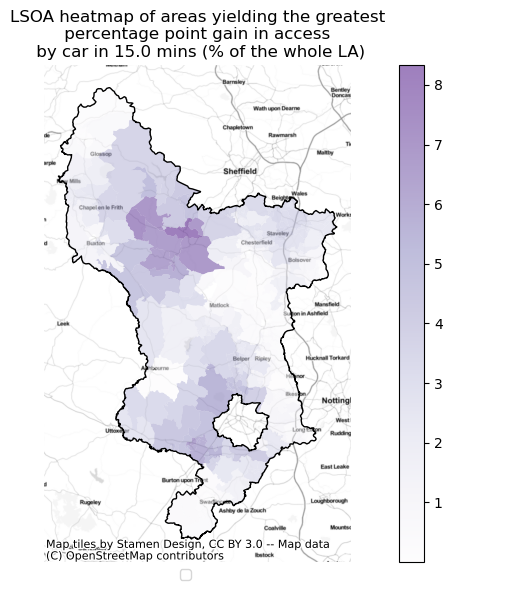

In [55]:
if run_for_driving == "y":
        
        geodf_subset_df_joined, test_driving_plot = plot_access_gain_results(
                dict_lsoa_mode_acessibility_area,
                subset_df,
                'car',
                global_params.drive_time)

<h2>create x, y scatter chart</h2>

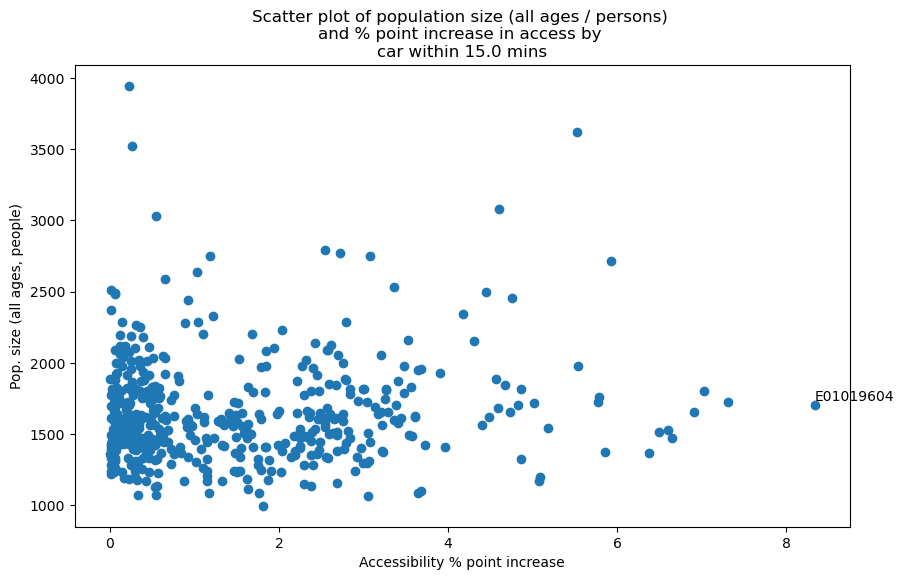

In [56]:
if run_for_driving == "y":
        
        chart, df_pop_estimate_persons_and_pct_gain_merged = create_x_y_scatter_chart(geodf_subset_df_joined,
                df_pop_estimate_persons_la_interest_subset,
                'car',
                global_params.drive_time)

In [57]:
if run_for_driving == "y":
    
    os.getcwd()
    os.chdir(brute_force_assets_path)
    os.getcwd()


Save both the scatter plot and the underlying dataset we used to produce it

In [58]:
if run_for_driving == "y":
    test_driving_plot.savefig(f"heatmap_improved_access_car.png", bbox_inches="tight")
    chart.savefig(f"x_y_scatter_car.png", bbox_inches="tight")
    df_pop_estimate_persons_and_pct_gain_merged.to_csv(f"df_for_x_y_scatter_car_{int(global_params.drive_time/60)}_mins.csv")

In [59]:
if run_for_driving == "y":
    go_up_one_directory()
    go_up_one_directory()

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\06_brute_force_optimisation_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


<h1>Cycling section</h1>

In [60]:
if run_for_cycling == "y":

    print("If you have run this code already for CYCLING and haven't changed the model parameters, you could read-in the saved isochrone polygons from last time the code ran - press 'n' when prompted.\nIf you have not run the code previously or have deleted the saved files, press 'y' when prompted to ensure the file runs as expected.")
    proceed = False

    while proceed == False:
        user_decision_run_api_call = input("Would you like to run the API call for cycling? (y / n)").lower()
        if user_decision_run_api_call == "y" or user_decision_run_api_call == "n":
            proceed = True
            if proceed == True:
                if user_decision_run_api_call == 'y':
                    print("Great. The API code will run next. This can take a while!")
                else:
                    print("Ok. The saved polygon files will be used.")
            else: #proceed is False
                print("Sorry, that is not a valid response. Please enter 'y' if you'd like to use the saved polygon files or 'n' if you'd like to run the API call.")
        else:
            print("Sorry, that is not a valid response. Please enter 'y' if you'd like to use the saved polygon files or 'n' if you'd like to run the API call.")

If you have run this code already for CYCLING and haven't changed the model parameters, you could read-in the saved isochrone polygons from last time the code ran - press 'n' when prompted.
If you have not run the code previously or have deleted the saved files, press 'y' when prompted to ensure the file runs as expected.
Great. The API code will run next. This can take a while!


In [61]:
if run_for_cycling == "y":

    if user_decision_run_api_call == 'n': #read in saved files for polygons
        
        #read the previously saved isochrone file to avoid running the isochrone API cell above with a long run time
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = pd.read_csv('df_iso_poly_all_poss_lsoas_cycling.csv') #using pandas #, index_col='index'
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #drop the unnamed column that is added as a result of the import
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.drop(df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.columns[0], axis=1)
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #create a geometry column from the string data type col containing geometry coords, using the wkt (well known text) package
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['geometry'] = df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['cycling-road'].apply(wkt.loads)
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = gpd.GeoDataFrame(df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites, crs='epsg:4326')
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #drop the original col containing poly as a string data type, now that we have converted this to a geometry type in the column called 'geometry'
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.drop(columns=['cycling-road'], axis=1)
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #test call to function - can be kept once the subsequent code has been replaced with functions and all working
        dict_nested_lsoa_travel_means_as_polygons_new_sites = convert_df_to_dict(gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites,'cycling-road')

    else: #run the api call
        dict_nested_lsoa_travel_means_new_sites, dict_nested_lsoa_travel_means_as_polygons_new_sites = brute_force_test_clinic_in_all_lsoas(
            test_geodf_clinic_points_reversed,
            dict_travel_mode_travel_time,
            apiKey,
            'cycling-road')
        
        #convert dict to df
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = pd.DataFrame.from_dict(dict_nested_lsoa_travel_means_as_polygons_new_sites).T.reset_index()

        #save the output from above to avoid having to re run the 33 min cell when testing / solving problem!
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.to_csv(f'{brute_force_assets_path}/df_iso_poly_all_poss_lsoas_cycling.csv')


In [62]:
if run_for_cycling == "y":

    #This cell should run regardless which method (new API call or reload saved files) was used above in the program
    dict_travel_means_merged_poly_new_clinic_site, test_subset = create_dict_merged_polygons_candidate_sites(dict_nested_lsoa_travel_means_as_polygons_new_sites, 'cycling-road', dict_travel_means_merged_baseline_poly)
    test_subset = list(test_subset)
    dict_travel_means_merged_poly_new_clinic_site

In [63]:
if run_for_cycling == "y":

    #determine net percent change to access percent for driving
    if user_decision_run_api_call == 'y': #ran the API call
        dict_lsoa_mode_acessibility_area = determine_accessibility_percent_la_area(
                'cycling-road',
                test_subset,
                dict_travel_means_merged_poly_new_clinic_site,
                subset_df_outer_la_border,
                dict_baseline_accessible_area_by_travel_means,
                False)
    else: #user used saved polygon files
        dict_lsoa_mode_acessibility_area = determine_accessibility_percent_la_area(
                'cycling-road',
                test_subset,
                dict_travel_means_merged_poly_new_clinic_site,
                subset_df_outer_la_border,
                dict_baseline_accessible_area_by_travel_means,
                True)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


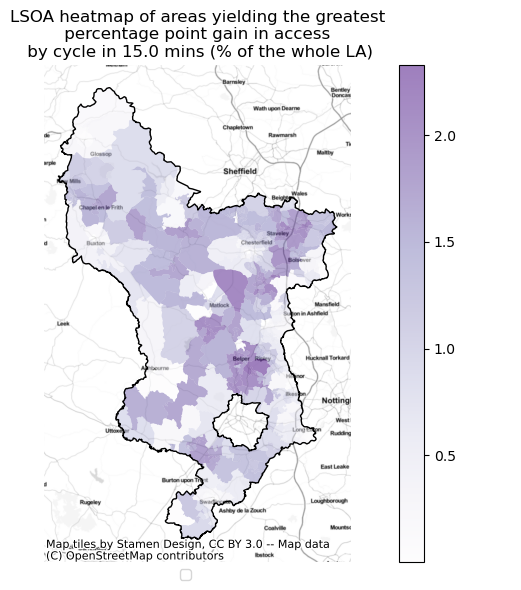

In [64]:
if run_for_cycling == "y":
    
        #test function call - once all working with all means of travel, retain the function above and this cell
        geodf_subset_df_joined, test_cycling_plot = plot_access_gain_results(
                dict_lsoa_mode_acessibility_area,
                subset_df,
                'cycle',
                global_params.drive_time)

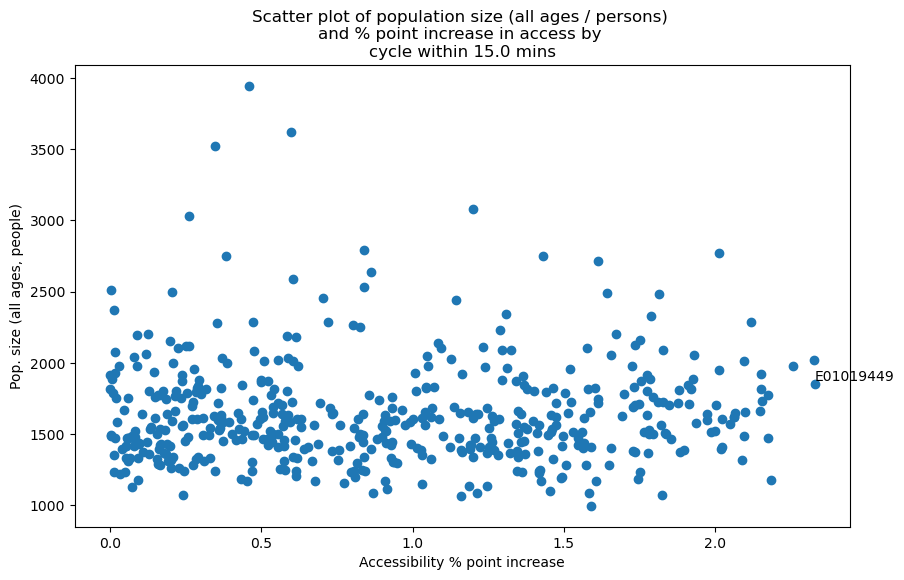

In [65]:
if run_for_cycling == "y":
        
        chart, df_pop_estimate_persons_and_pct_gain_merged = create_x_y_scatter_chart(geodf_subset_df_joined,
                df_pop_estimate_persons_la_interest_subset,
                'cycle',
                global_params.drive_time)

In [66]:
if run_for_cycling == "y":

    os.getcwd()
    os.chdir(brute_force_assets_path)
    os.getcwd()

In [67]:
if run_for_cycling == "y":

    test_cycling_plot.savefig(f"heatmap_improved_access_cycle.png", bbox_inches="tight")
    chart.savefig(f"x_y_scatter_cycle.png")
    df_pop_estimate_persons_and_pct_gain_merged.to_csv(f"df_for_x_y_scatter_cycle_{int(global_params.cycle_time/60)}_mins.csv")
    go_up_one_directory()
    go_up_one_directory()

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\06_brute_force_optimisation_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


<h1>Walking section</h1>

In [68]:
if run_for_walking == "y":

    print("If you have run this code already for WALKING and haven't changed the model parameters, you could read-in the saved isochrone polygons from last time the code ran - press 'n' when prompted.\nIf you have not run the code previously or have deleted the saved files, press 'y' when prompted to ensure the file runs as expected.")
    proceed = False

    while proceed == False:
        user_decision_run_api_call = input("Would you like to run the API call for walking? (y / n)").lower()
        if user_decision_run_api_call == "y" or user_decision_run_api_call == "n":
            proceed = True
            if proceed == True:
                if user_decision_run_api_call == 'y':
                    print("Great. The API code will run next. This can take a while!")
                else:
                    print("Ok. The saved polygon files will be used.")
            else: #proceed is False
                print("Sorry, that is not a valid response. Please enter 'y' if you'd like to use the saved polygon files or 'n' if you'd like to run the API call.")
        else:
            print("Sorry, that is not a valid response. Please enter 'y' if you'd like to use the saved polygon files or 'n' if you'd like to run the API call.")

If you have run this code already for WALKING and haven't changed the model parameters, you could read-in the saved isochrone polygons from last time the code ran - press 'n' when prompted.
If you have not run the code previously or have deleted the saved files, press 'y' when prompted to ensure the file runs as expected.
Great. The API code will run next. This can take a while!


In [69]:
if run_for_walking == "y":

    if user_decision_run_api_call == 'n': #read in saved files for polygons
        
        #read the previously saved isochrone file to avoid running the isochrone API cell above with a long run time
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = pd.read_csv('df_iso_poly_all_poss_lsoas_walking.csv') #using pandas #, index_col='index'
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #drop the unnamed column that is added as a result of the import
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.drop(df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.columns[0], axis=1)
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #create a geometry column from the string data type col containing geometry coords, using the wkt (well known text) package
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['geometry'] = df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['foot-walking'].apply(wkt.loads)
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = gpd.GeoDataFrame(df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites, crs='epsg:4326')
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #drop the original col containing poly as a string data type, now that we have converted this to a geometry type in the column called 'geometry'
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.drop(columns=['foot-walking'], axis=1)
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #test call to function - can be kept once the subsequent code has been replaced with functions and all working
        dict_nested_lsoa_travel_means_as_polygons_new_sites = convert_df_to_dict(gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites,'foot-walking')

    else: #run the api call
        dict_nested_lsoa_travel_means_new_sites, dict_nested_lsoa_travel_means_as_polygons_new_sites = brute_force_test_clinic_in_all_lsoas(
            test_geodf_clinic_points_reversed,
            dict_travel_mode_travel_time,
            apiKey,
            'foot-walking')
        
        #convert dict to df
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = pd.DataFrame.from_dict(dict_nested_lsoa_travel_means_as_polygons_new_sites).T.reset_index()

        #save the output from above to avoid having to re run the 33 min cell when testing / solving problem!
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.to_csv(f'{brute_force_assets_path}/df_iso_poly_all_poss_lsoas_walking.csv')


In [70]:
if run_for_walking == "y":

    #This cell should run regardless which method (new API call or reload saved files) was used above in the program
    dict_travel_means_merged_poly_new_clinic_site, test_subset = create_dict_merged_polygons_candidate_sites(dict_nested_lsoa_travel_means_as_polygons_new_sites, 'foot-walking', dict_travel_means_merged_baseline_poly)
    test_subset = list(test_subset)
    dict_travel_means_merged_poly_new_clinic_site

In [71]:
if run_for_walking == "y":

    #determine net percent change to access percent for driving
    if user_decision_run_api_call == 'y': #ran the API call
        dict_lsoa_mode_acessibility_area = determine_accessibility_percent_la_area(
                'foot-walking',
                test_subset,
                dict_travel_means_merged_poly_new_clinic_site,
                subset_df_outer_la_border,
                dict_baseline_accessible_area_by_travel_means,
                False)
    else: #user used saved polygon files
        dict_lsoa_mode_acessibility_area = determine_accessibility_percent_la_area(
                'foot-walking',
                test_subset,
                dict_travel_means_merged_poly_new_clinic_site,
                subset_df_outer_la_border,
                dict_baseline_accessible_area_by_travel_means,
                True)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


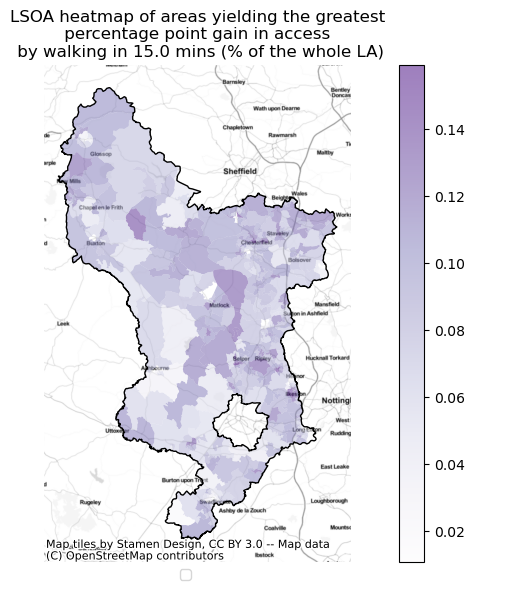

In [72]:
if run_for_walking == "y":

        #test function call - once all working with all means of travel, retain the function above and this cell
        geodf_subset_df_joined, test_cycling_plot = plot_access_gain_results(
                dict_lsoa_mode_acessibility_area,
                subset_df,
                'walking',
                global_params.drive_time)

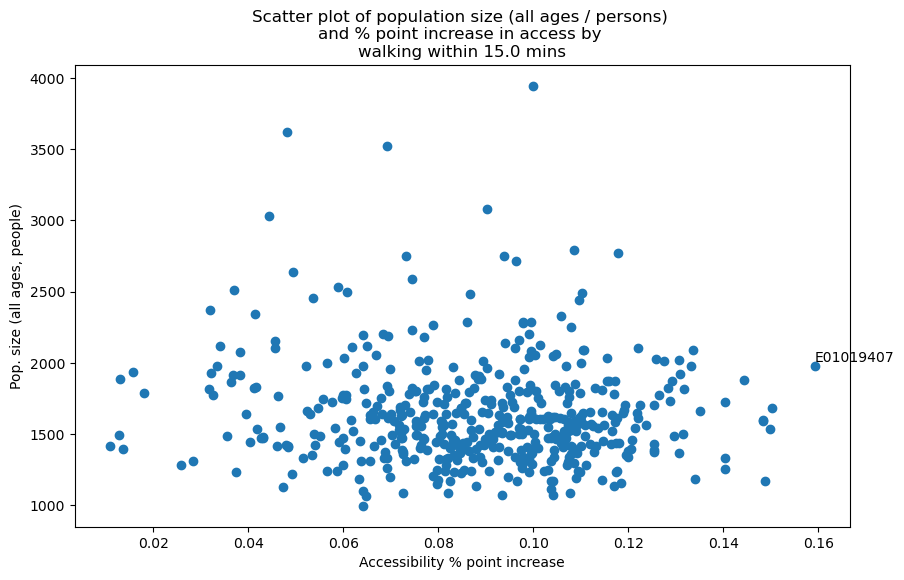

In [73]:
if run_for_walking == "y":

        chart, df_pop_estimate_persons_and_pct_gain_merged = create_x_y_scatter_chart(geodf_subset_df_joined,
                df_pop_estimate_persons_la_interest_subset,
                'walking',
                global_params.drive_time)

In [74]:
if run_for_walking == "y":

    os.getcwd()
    os.chdir(brute_force_assets_path)
    os.getcwd()

In [75]:
if run_for_walking == "y":

    test_cycling_plot.savefig(f"heatmap_improved_access_walking.png", bbox_inches="tight")
    chart.savefig(f"x_y_scatter_walking.png")
    df_pop_estimate_persons_and_pct_gain_merged.to_csv(f"df_for_x_y_scatter_walking_{int(global_params.walking_time/60)}_mins.csv")
    go_up_one_directory()
    go_up_one_directory()

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\06_brute_force_optimisation_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


<h1>Wheelchair section</h1>

In [76]:
if run_for_wheelchair == "y":

    print("If you have run this code already for WHEELCHAIR TRAVEL and haven't changed the model parameters, you could read-in the saved isochrone polygons from last time the code ran - press 'n' when prompted.\nIf you have not run the code previously or have deleted the saved files, press 'y' when prompted to ensure the file runs as expected.")
    proceed = False

    while proceed == False:
        user_decision_run_api_call = input("Would you like to run the API call for wheelchair travel? (y / n)").lower()
        if user_decision_run_api_call == "y" or user_decision_run_api_call == "n":
            proceed = True
            if proceed == True:
                if user_decision_run_api_call == 'y':
                    print("Great. The API code will run next. This can take a while!")
                else:
                    print("Ok. The saved polygon files will be used.")
            else: #proceed is False
                print("Sorry, that is not a valid response. Please enter 'y' if you'd like to use the saved polygon files or 'n' if you'd like to run the API call.")
        else:
            print("Sorry, that is not a valid response. Please enter 'y' if you'd like to use the saved polygon files or 'n' if you'd like to run the API call.")

In [77]:
if run_for_wheelchair == "y":

    if user_decision_run_api_call == 'n': #read in saved files for polygons
        
        #read the previously saved isochrone file to avoid running the isochrone API cell above with a long run time
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = pd.read_csv('df_iso_poly_all_poss_lsoas_wheelchair.csv') #using pandas #, index_col='index'
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #drop the unnamed column that is added as a result of the import
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.drop(df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.columns[0], axis=1)
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #create a geometry column from the string data type col containing geometry coords, using the wkt (well known text) package
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['geometry'] = df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites['wheelchair'].apply(wkt.loads)
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = gpd.GeoDataFrame(df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites, crs='epsg:4326')
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #drop the original col containing poly as a string data type, now that we have converted this to a geometry type in the column called 'geometry'
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.drop(columns=['wheelchair'], axis=1)
        gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.head()

        #test call to function - can be kept once the subsequent code has been replaced with functions and all working
        dict_nested_lsoa_travel_means_as_polygons_new_sites = convert_df_to_dict(gdf_from_dict_nested_lsoa_travel_means_as_polygons_new_sites,'wheelchair')

    else: #run the api call
        """
        #testing section to work through why wheelchair section crashes - discovered this is for at least 1 LSOA centroid location and possibly due to the API logic. 
        #user can now skip specific means of travel if they either a) dont want to run for these means or b) the API fails to run for their LA's LSOA centroid(s) too.
        dict_nested_lsoa_travel_means_new_sites, dict_nested_lsoa_travel_means_as_polygons_new_sites = brute_force_test_clinic_in_all_lsoas_test(
            test_geodf_clinic_points_reversed,
            dict_travel_mode_travel_time,
            apiKey,
            'wheelchair')
        """
        dict_nested_lsoa_travel_means_new_sites, dict_nested_lsoa_travel_means_as_polygons_new_sites = brute_force_test_clinic_in_all_lsoas(
            test_geodf_clinic_points_reversed,
            dict_travel_mode_travel_time,
            apiKey,
            'wheelchair')
        
        
        #convert dict to df
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites = pd.DataFrame.from_dict(dict_nested_lsoa_travel_means_as_polygons_new_sites).T.reset_index()

        #save the output from above to avoid having to re run the 33 min cell when testing / solving problem!
        df_from_dict_nested_lsoa_travel_means_as_polygons_new_sites.to_csv(f'{brute_force_assets_path}/df_iso_poly_all_poss_lsoas_wheelchair.csv')


In [78]:
if run_for_wheelchair == "y":

    #This cell should run regardless which method (new API call or reload saved files) was used above in the program
    dict_travel_means_merged_poly_new_clinic_site, test_subset = create_dict_merged_polygons_candidate_sites(dict_nested_lsoa_travel_means_as_polygons_new_sites, 'wheelchair', dict_travel_means_merged_baseline_poly)
    test_subset = list(test_subset)
    dict_travel_means_merged_poly_new_clinic_site

In [79]:
if run_for_wheelchair == "y":

    #determine net percent change to access percent for driving
    if user_decision_run_api_call == 'y': #ran the API call
        dict_lsoa_mode_acessibility_area = determine_accessibility_percent_la_area(
                'wheelchair',
                test_subset,
                dict_travel_means_merged_poly_new_clinic_site,
                subset_df_outer_la_border,
                dict_baseline_accessible_area_by_travel_means,
                False)
    else: #user used saved polygon files
        dict_lsoa_mode_acessibility_area = determine_accessibility_percent_la_area(
                'wheelchair',
                test_subset,
                dict_travel_means_merged_poly_new_clinic_site,
                subset_df_outer_la_border,
                dict_baseline_accessible_area_by_travel_means,
                True)


In [80]:
if run_for_wheelchair == "y":
    
        #test function call - once all working with all means of travel, retain the function above and this cell
        geodf_subset_df_joined, test_wheelchair_plot = plot_access_gain_results(
                dict_lsoa_mode_acessibility_area,
                subset_df,
                'wheelchair',
                global_params.drive_time)

In [81]:
if run_for_wheelchair == "y":

        chart, df_pop_estimate_persons_and_pct_gain_merged = create_x_y_scatter_chart(geodf_subset_df_joined,
                df_pop_estimate_persons_la_interest_subset,
                'wheelchair',
                global_params.drive_time)

In [82]:
if run_for_wheelchair == "y":
    os.getcwd()
    os.chdir(brute_force_assets_path)
    os.getcwd()
    test_wheelchair_plot.savefig(f"heatmap_improved_access_wheelchair.png", bbox_inches="tight")
    chart.savefig(f"x_y_scatter_wheelchair.png")
    df_pop_estimate_persons_and_pct_gain_merged.to_csv(f"df_for_x_y_scatter_wheelchair_{int(global_params.wheelchair_time/60)}_mins.csv")
    go_up_one_directory()
    go_up_one_directory()


<h1>Report production section</h1>

In [83]:
#change current working directory to the relevant assets folder
print(os.getcwd())
os.chdir(brute_force_assets_path)
print(os.getcwd())

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\06_brute_force_optimisation_assets


In [84]:
#create a dataframe summarising which means of travel were included in the model. This can be used in the report. 
list_means_travel_for_df = ['driving', 'cycling', 'walking', 'wheelchair']
list_travel_included_status = [run_for_driving, run_for_cycling, run_for_walking, run_for_wheelchair]
df_travel_means_included_for_report = pd.DataFrame(list_travel_included_status, list_means_travel_for_df).reset_index().rename(columns={'index': 'Means of travel', 0: 'Included?'})
df_travel_means_included_for_report['Included?'] = df_travel_means_included_for_report['Included?'].replace('y', 'Yes')
df_travel_means_included_for_report['Included?'] = df_travel_means_included_for_report['Included?'].replace('n', 'No')
#df_travel_means_included_for_report

In [94]:
go_up_one_directory()
go_up_one_directory()

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\06_brute_force_optimisation_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


In [95]:
#create doc object
doc = docx.Document('template.docx')
#variable for numbering charts, lists etc
chart_counter = 1
assumption_counter = 1
parameter_counter = 1
appendix_count = 1 #remove when finalised as this variable overwrites the variable of the same name near the start of the file
interpolation_method_explanation_required = False

from docx.shared import Pt #new
style = doc.styles['Normal'] #new
font = style.font #new
font.name = 'Arial' #new
font.size = Pt(12) #new

#add new paragraph of text to the doc 
# note: add_paragraph and add_run accept option 2nd argument as a string of the paragraph or run object's style
run = doc.add_paragraph(f'Potential Locations for Introducing a New Clinic', 'Title')


paraObj1 = doc.add_paragraph()
run = paraObj1.add_run(f'This automated report summarises findings from a decision support tool produced Matthew Eves, Anya Gopfert and Sally Brown. This tool seeks to identify which geographical areas would yield the greatest increase in access by various means of travel.')

# -----------------------------------------------------------

#add a heading. Heading "level" can be determined by the interger param after the string
#0 = title, 1 = top header, 4 = smallest subheading
doc.add_heading('1. Means of travel considered and Method Overview', 1)
paraObj2 = doc.add_paragraph(f'The table below summarises which means of travel were considered when running this model.')
add_df_as_table(preferred_font_name, doc, df_travel_means_included_for_report, chosen_style)

paraObj2 = doc.add_paragraph(f'\nThe method used by this model is summarised as follows:')
paraObj3 = doc.add_paragraph(f"1. Retrieve all LSOAs for the relevant Local Authority")
paraObj4 = doc.add_paragraph(f"2. Identify in which LSOAs the current clinic locations are sited")
paraObj5 = doc.add_paragraph(f"3. Remove those LSOAs from the list of all LSOAs")
paraObj6 = doc.add_paragraph(f"4. For the first LSOA in the list of remaining LSOA, quantify the net change in the % of the Local Authority's area that can access at least 1 clinic, should a new clinic be introduced in that LSOA")
paraObj7 = doc.add_paragraph(f"5. Repeat step 4 for all means of travel in scope")
paraObj8 = doc.add_paragraph(f"6. Repeat steps 4-5 for all remaining LSOAs not currently containing a clinic")

# -----------------------------------------------------------
#adding heatmaps
doc.add_heading('2. Results', 1)
paraObj2 = doc.add_paragraph(f'The maps below indicate the effect on accessibilty by introducing one new clinic in each LSOA. Darker shades of purple indicate that introducing a clinic in that LSOA would yield a greater increase in the % of the Local Authority that can access at least 1 clinic within the given journey time for the given means of transport.')

#driving
if run_for_driving == 'y':
    doc.add_heading('Driving: heatmap of increased accessibility', 2)
    heatmap = f"{brute_force_assets_path}/heatmap_improved_access_car.png"
    change_image_size_pydoc(
        doc,
        0.5,
        heatmap
        )

#cycling  
if run_for_cycling == 'y':
    doc.add_heading('Cycling: heatmap of increased accessibility', 2)
    heatmap = f"{brute_force_assets_path}/heatmap_improved_access_cycle.png"
    change_image_size_pydoc(
        doc,
        0.5,
        heatmap
        )

#walking
if run_for_walking == 'y':
    doc.add_heading('Walking: heatmap of increased accessibility', 2)
    heatmap = f"{brute_force_assets_path}/heatmap_improved_access_car.png"
    change_image_size_pydoc(
        doc,
        0.5,
        heatmap
        )

#wheelchair
if run_for_wheelchair == 'y':
    doc.add_heading('Wheelchair: heatmap of increased accessibility', 2)
    heatmap = f"{brute_force_assets_path}/heatmap_improved_access_wheelchair.png"
    change_image_size_pydoc(
        doc,
        0.5,
        heatmap
        )

# -----------------------------------------------------------
#x, y scatter chart section

paraObj3 = doc.add_paragraph(f'The charts below plot for each given means of travel, the access % gain vs. the all-age all-gender population size for each LSOA, in addition to highlighting the LSOA code yielding the highest % point gain. This provides context and allows for consideration of other locations which may not be the maximum access site, but would stand to benefit more people.')

#driving
if run_for_driving == 'y':
    doc.add_heading('Driving: scatterplot of increased accessibility vs population size', 2)
    heatmap = f"{brute_force_assets_path}/x_y_scatter_car.png"
    change_image_size_pydoc(
        doc,
        0.5,
        heatmap
        )

#cycling  
if run_for_cycling == 'y':
    doc.add_heading('Cycling: scatterplot of increased accessibility vs population size', 2)
    heatmap = f"{brute_force_assets_path}/x_y_scatter_cycle.png"
    change_image_size_pydoc(
        doc,
        0.5,
        heatmap
        )

#walking
if run_for_walking == 'y':
    doc.add_heading('Walking: scatterplot of increased accessibility vs population size', 2)
    heatmap = f"{brute_force_assets_path}/x_y_scatter_walking.png"
    change_image_size_pydoc(
        doc,
        0.5,
        heatmap
        )

#wheelchair
if run_for_wheelchair == 'y':
    doc.add_heading('Wheelchair: scatterplot of increased accessibility vs population size', 2)
    heatmap = f"{brute_force_assets_path}/x_y_scatter_wheelchair.png"
    change_image_size_pydoc(
        doc,
        0.5,
        heatmap
        )

os.chdir('Assets_produced_by_code')
os.chdir('06_brute_force_optimisation_assets')
#save document object to a file
#doc.save(f'{brute_force_assets_path}/zReport_Heatmaps_Max_Access_Increase.docx')
doc.save('zReport_Heatmaps_Max_Access_Increase.docx')

new width : 2382012
new height : 2697480
new width : 2382012
new height : 2697480
new width : 2382012
new height : 2697480
new width : 4133088
new height : 2651760
new width : 4572000
new height : 2743200
new width : 4572000
new height : 2743200
